In [1]:
#This cell imports the required modules to the notebook
#RUN THIS CELL BEFORE ANY OTHER CODE IS RUN
import matplotlib.pyplot as plt     #imports graph plotting library
import astropy.io.fits as ast       #imports FITS manipulation library
import numpy as np                  #imports numerical manipulation library
import random                       #imports module to generate random numbers for monte carlo error propagation
import csv

#magic function that forces plots to appear in this notebook
%matplotlib inline                  
plt.ion()                           #function that loads plotting library in "interactive mode"

from astropy.utils.data import get_pkg_data_filename   #imports function to get filename of data file
from scipy.stats import sem

print("Required Libraries Loaded Successfully")

def graderr(R, err, n): #user defined function does monte carlo error propagation
    """
    function for calculating the error in the gradient, using a monte carlo error propagation philosophy
    """
    grads = [[] for count in range(n)]                 #initialises list of lists, with indices [iteration][latitude]
    for i in range(n):                                 #loops through randomisation process n times
        randR = np.zeros(len(R))                       #initialises list of random R values
        for j in range(len(R)):                        #loops through the random function to form the list
            #randR[j] = random.uniform(R[j]-err[j], R[j]+err[j]) #generates random number within bounds of error bars
            randR[j] = np.random.normal(R[j],err[j])
        grads[i] = np.gradient(randR)                  #finds the gradient of the random R list generated above
        
    graderr = np.zeros(len(R))                         #initialises the list of gradient errors
    for i in range(len(R)):                            #loops through list of error calculation from the lists of random R
        gradforpoint = np.zeros(n)                     #initialises restructured list of iterations of grad, index [latitude]
        for j in range(n):                             #loops through the iterations
            gradforpoint[j] = grads[j][i]              #gets the gradR error through each iteration and makes a new list from it
        graderr[i] = (max(gradforpoint)-min(gradforpoint))/2 #calculates error by finding the mean of the max and min errors
    return(graderr)                                    #returns list of errors

from RefFunc import *
print("User-Defined Functions Loaded Successfully")

latlimits = [40,-90] #values for latitude chosen
degpererrbar = 1    #chosen
print("Graphical Parameters Initialised")

csv_467 = open('plotdata/467_time.csv',mode='r')
csv_547 = open('plotdata/547_time.csv',mode='r')
csv_619 = open('plotdata/619_time.csv',mode='r')
csv_657 = open('plotdata/657_time.csv',mode='r')
csv_727 = open('plotdata/727_time.csv',mode='r')
csv_763 = open('plotdata/763_time.csv',mode='r')
csv_845 = open('plotdata/845_time.csv',mode='r' )
reader467 = csv.reader(csv_467, delimiter=',')
reader547 = csv.reader(csv_547, delimiter=',')
reader619 = csv.reader(csv_619, delimiter=',')
reader657 = csv.reader(csv_657, delimiter=',')
reader727 = csv.reader(csv_727, delimiter=',')
reader763 = csv.reader(csv_763, delimiter=',')
reader845 = csv.reader(csv_845, delimiter=',')
csv_467_1 = open('plotdata/467_time_1.csv', mode='w')
csv_547_1 = open('plotdata/547_time_1.csv', mode='w')
csv_619_1 = open('plotdata/619_time_1.csv', mode='w')
csv_657_1 = open('plotdata/657_time_1.csv', mode='w')
csv_727_1 = open('plotdata/727_time_1.csv', mode='w')
csv_763_1 = open('plotdata/763_time_1.csv', mode='w')
csv_845_1 = open('plotdata/845_time_1.csv', mode='w')
writer467 = csv.writer(csv_467_1, delimiter=',')
writer547 = csv.writer(csv_547_1, delimiter=',')
writer619 = csv.writer(csv_619_1, delimiter=',')
writer657 = csv.writer(csv_657_1, delimiter=',')
writer727 = csv.writer(csv_727_1, delimiter=',')
writer763 = csv.writer(csv_763_1, delimiter=',')
writer845 = csv.writer(csv_845_1, delimiter=',')



print("Time Series .csv files prepared.")

Required Libraries Loaded Successfully
User-Defined Functions Loaded Successfully
Graphical Parameters Initialised
Time Series .csv files prepared.


# Year 2020

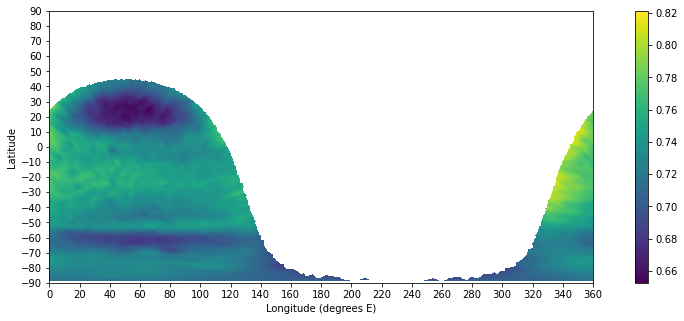

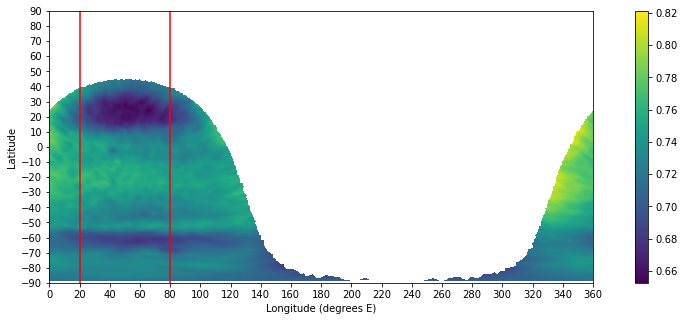

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3372: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\_methods.py:233: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\_methods.py:194: RuntimeWarning: invalid value encountered in true_divide
  arrmean = um.true_divide(
C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\_methods.py:226: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


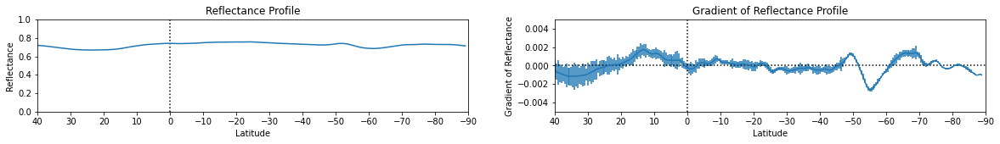

Data Successfully Written to: plotdata/2020_467.csv


In [2]:
good = False
file = get_pkg_data_filename('maps/2020/467_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 20#float(input('Please input the leftmost longitude of the range desired: '))
    right = 80#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2020_467.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

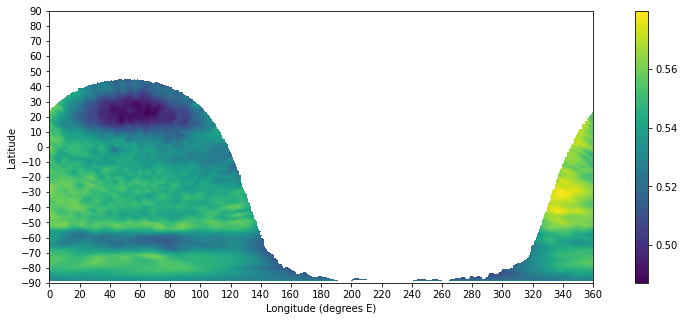

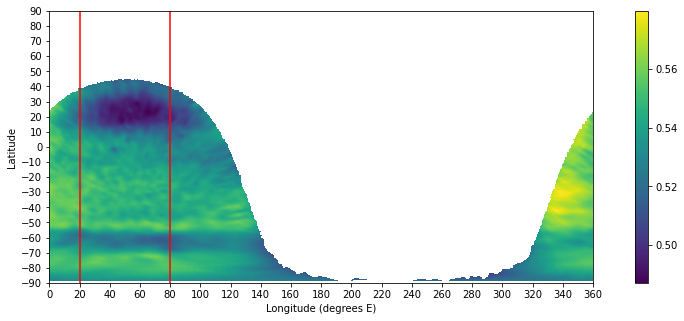

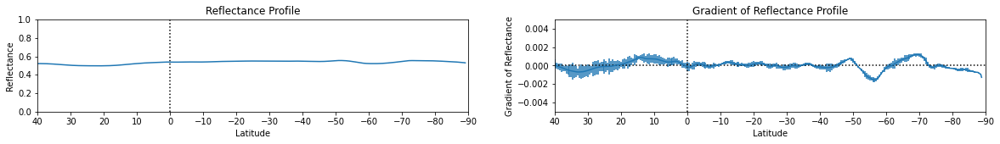

Data Successfully Written to: plotdata/2020_547.csv


In [3]:
good = False
file = get_pkg_data_filename('maps/2020/547_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 20#float(input('Please input the leftmost longitude of the range desired: '))
    right = 80#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2020_547.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

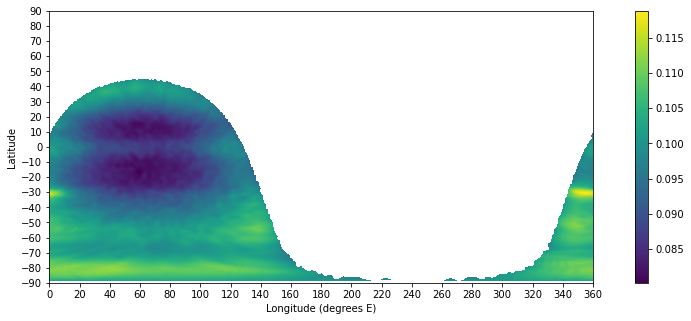

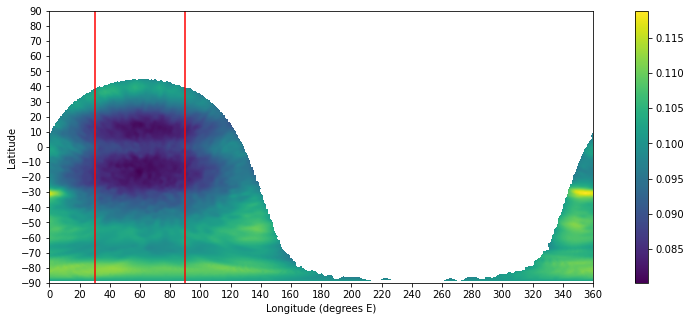

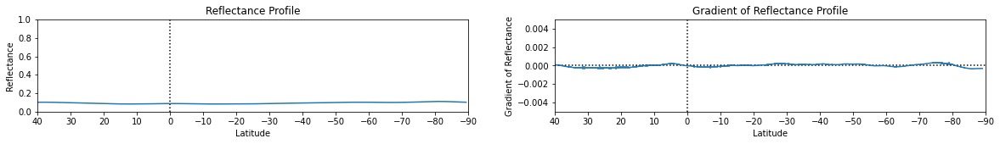

Data Successfully Written to: plotdata/2020_619.csv


In [4]:
good = False
file = get_pkg_data_filename('maps/2020/619_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 30#float(input('Please input the leftmost longitude of the range desired: '))
    right = 90#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2020_619.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

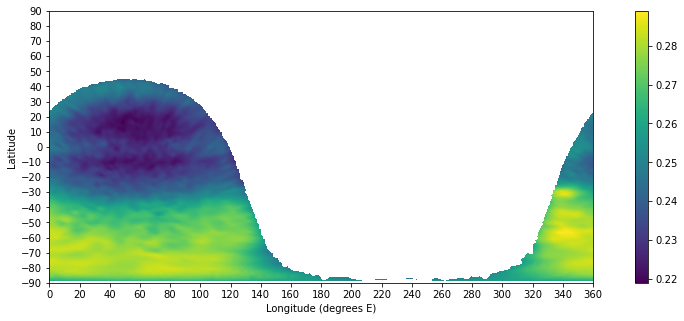

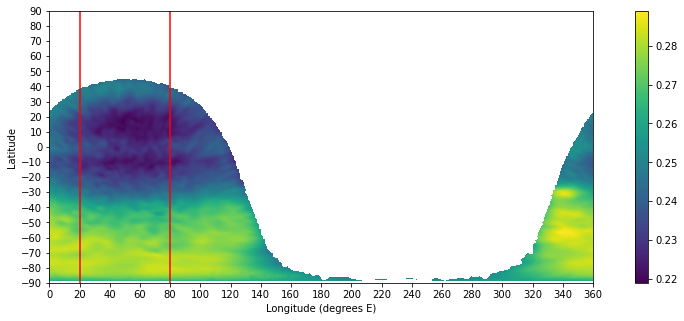

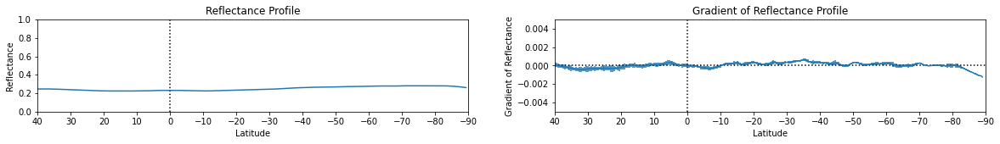

Data Successfully Written to: plotdata/2020_657.csv


In [5]:
good = False
file = get_pkg_data_filename('maps/2020/657_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 20#float(input('Please input the leftmost longitude of the range desired: '))
    right = 80#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2020_657.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

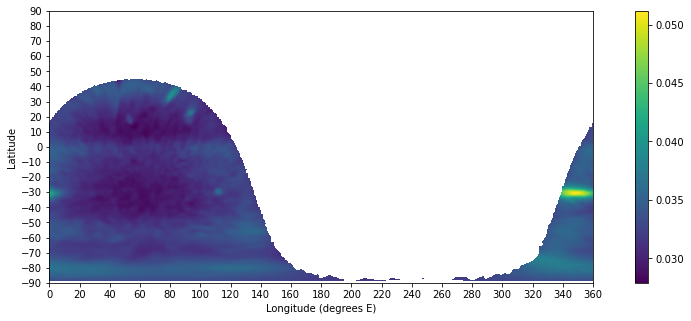

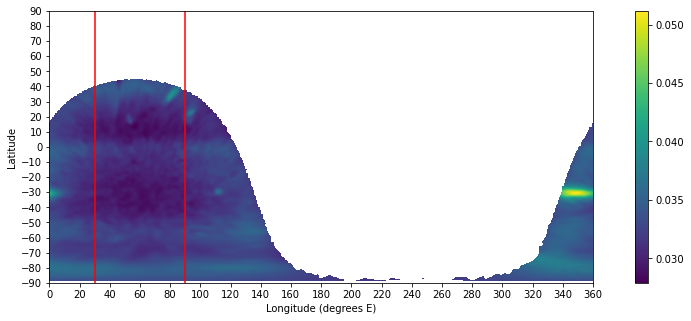

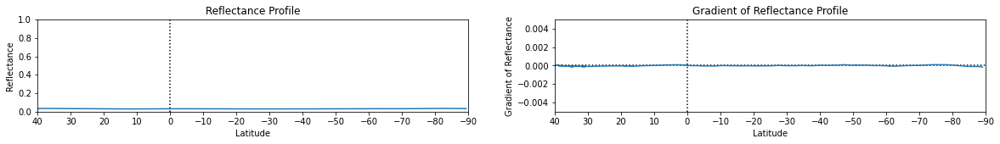

Data Successfully Written to: plotdata/2020_727.csv


In [6]:
good = False
file = get_pkg_data_filename('maps/2020/727_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 30#float(input('Please input the leftmost longitude of the range desired: '))
    right = 90#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2020_727.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

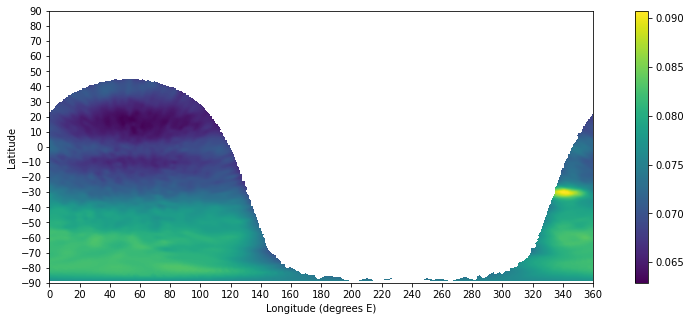

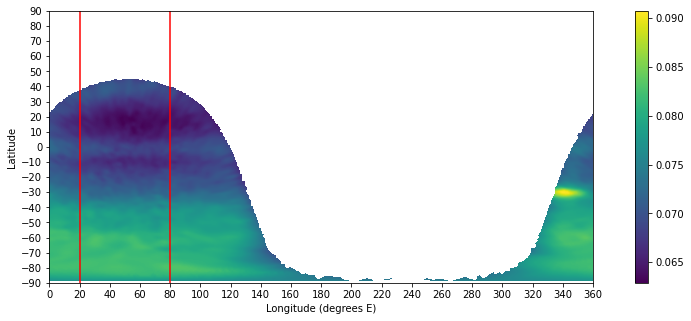

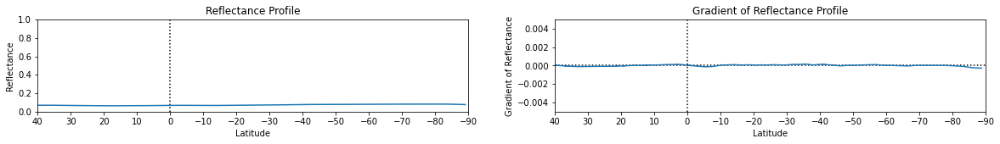

Data Successfully Written to: plotdata/2020_763.csv


In [7]:
good = False
file = get_pkg_data_filename('maps/2020/763_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 20#float(input('Please input the leftmost longitude of the range desired: '))
    right = 80#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2020_763.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

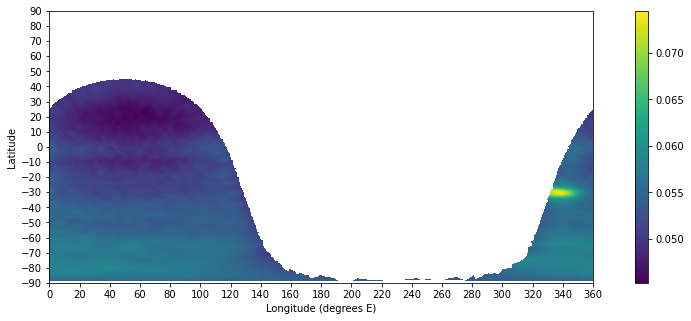

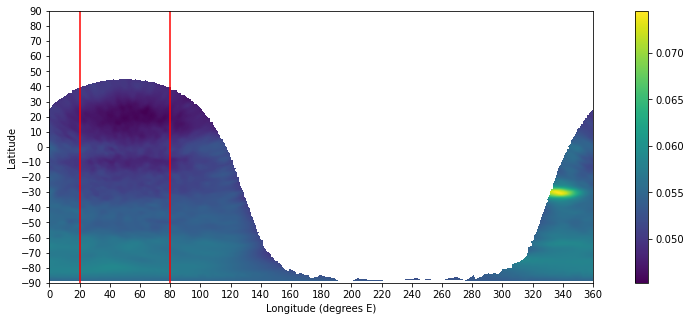

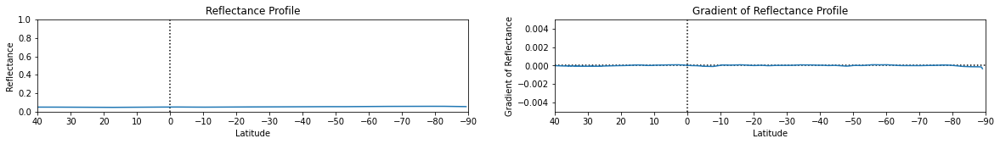

Data Successfully Written to: plotdata/2020_845.csv


In [8]:
good = False
file = get_pkg_data_filename('maps/2020/845_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 20#float(input('Please input the leftmost longitude of the range desired: '))
    right = 80#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2020_845.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

# Year 2019

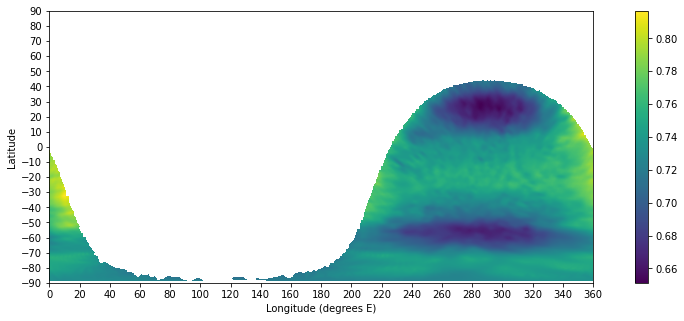

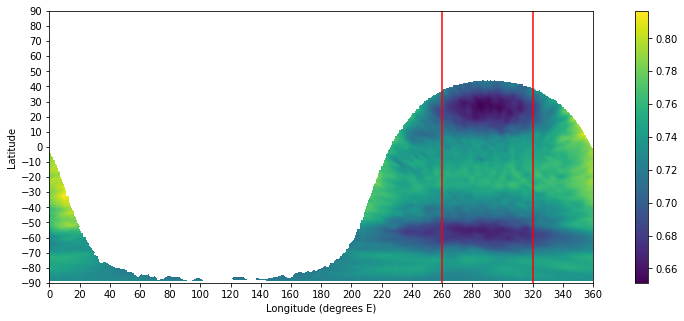

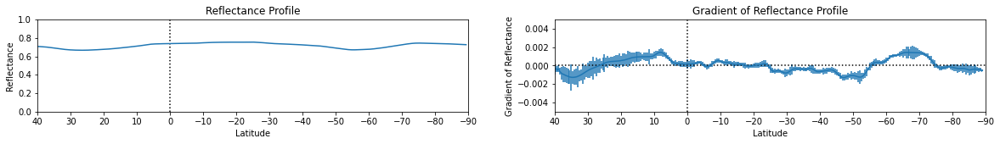

Data Successfully Written to: plotdata/2019_467.csv


In [9]:
good = False
file = get_pkg_data_filename('maps/2019/467_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 260#float(input('Please input the leftmost longitude of the range desired: '))
    right = 320#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2019_467.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

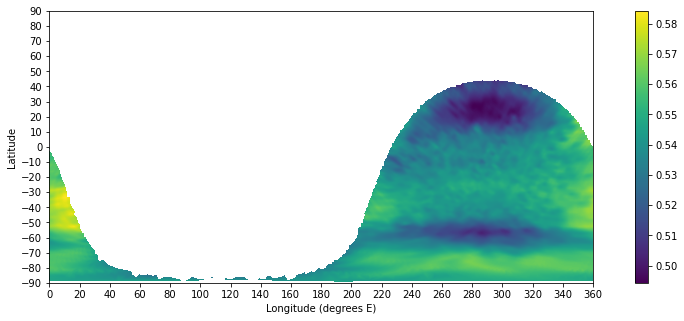

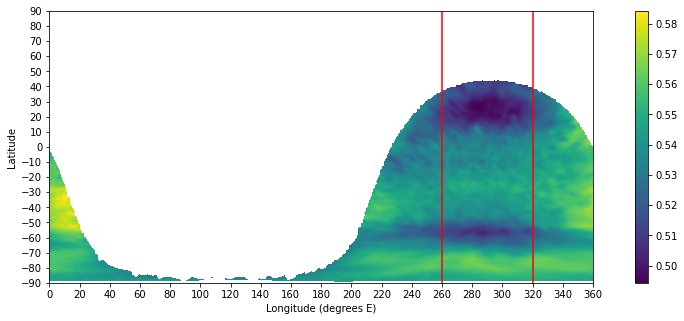

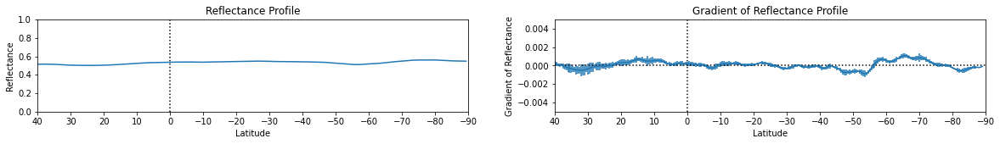

Data Successfully Written to: plotdata/2019_547.csv


In [10]:
good = False
file = get_pkg_data_filename('maps/2019/547_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 260#float(input('Please input the leftmost longitude of the range desired: '))
    right = 320#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2019_547.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

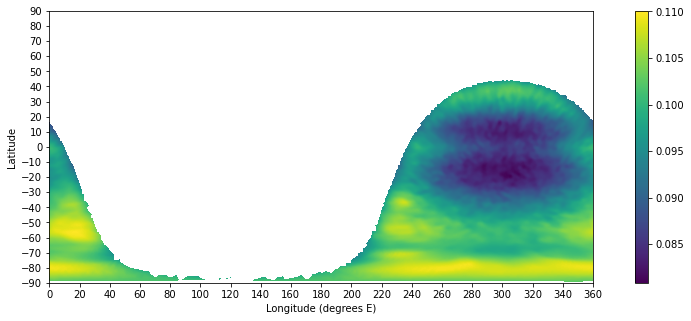

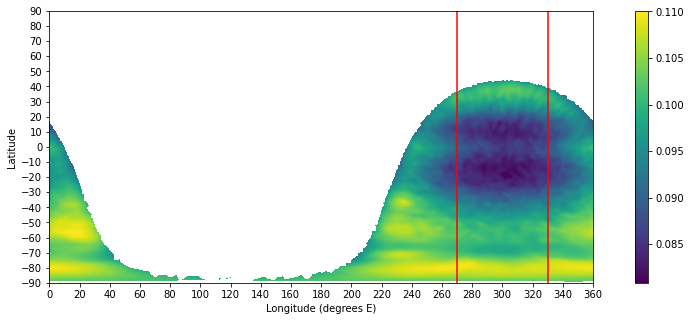

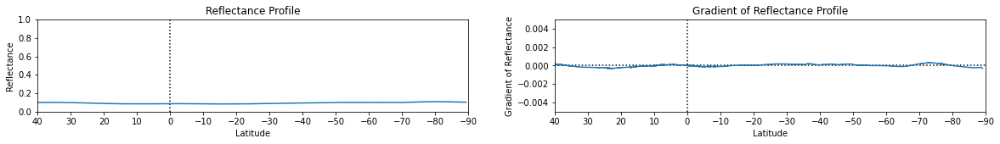

Data Successfully Written to: plotdata/2019_619.csv


In [11]:
good = False
file = get_pkg_data_filename('maps/2019/619_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 270#float(input('Please input the leftmost longitude of the range desired: '))
    right = 330#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2019_619.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

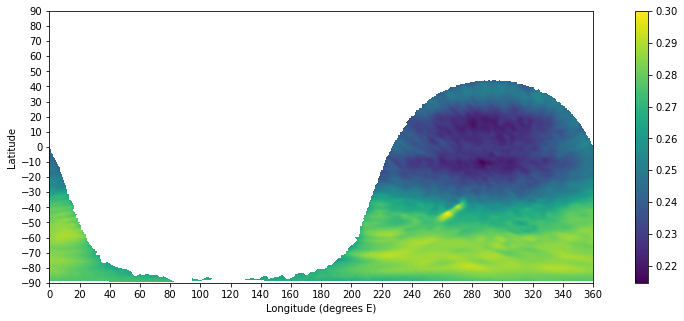

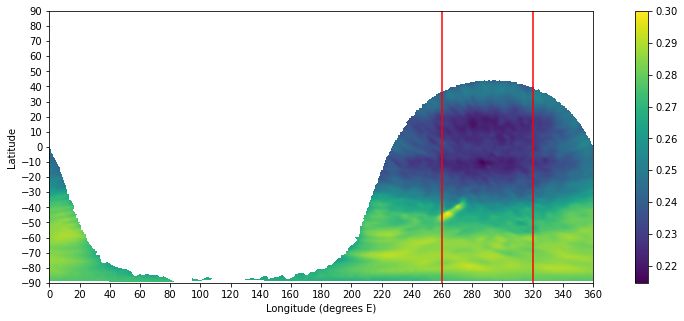

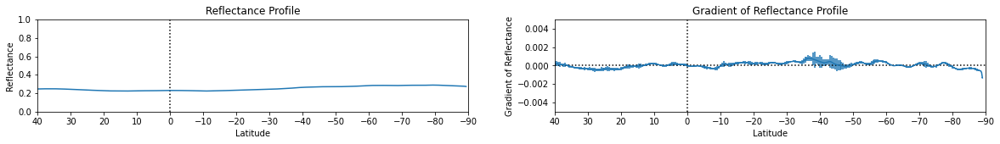

Data Successfully Written to: plotdata/2019_657.csv


In [12]:
good = False
file = get_pkg_data_filename('maps/2019/657_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 260#float(input('Please input the leftmost longitude of the range desired: '))
    right = 320#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2019_657.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

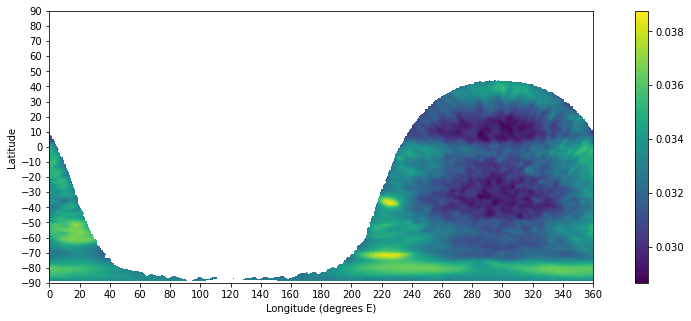

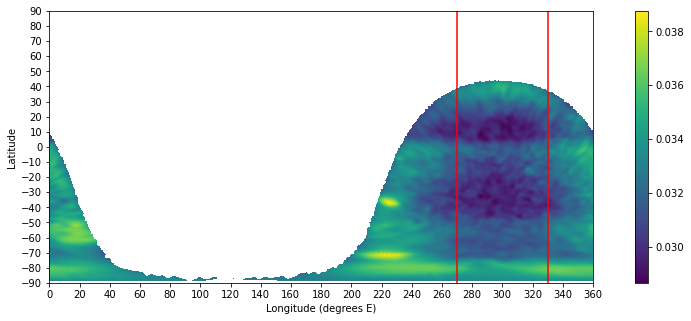

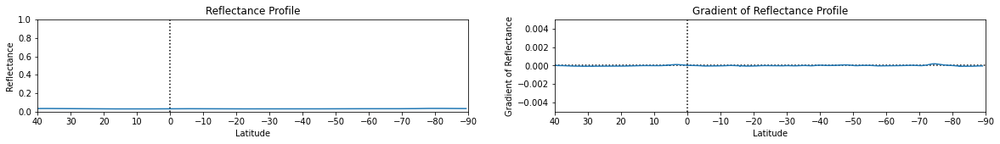

Data Successfully Written to: plotdata/2019_727.csv


In [13]:
good = False
file = get_pkg_data_filename('maps/2019/727_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 270#float(input('Please input the leftmost longitude of the range desired: '))
    right = 330#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2019_727.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

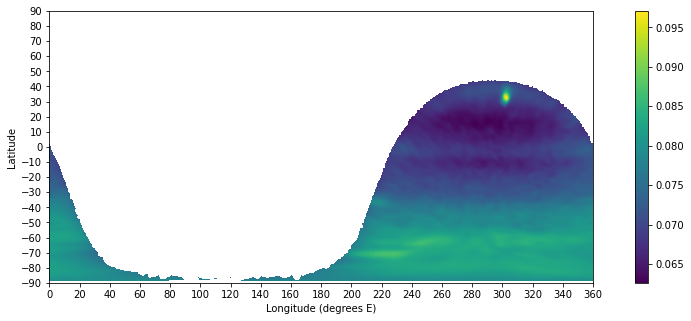

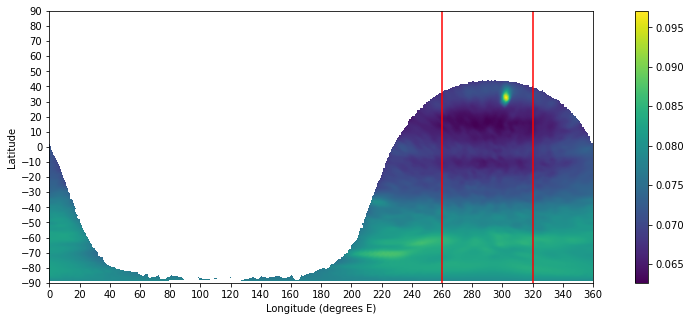

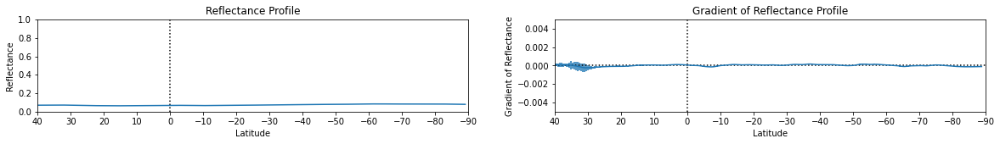

Data Successfully Written to: plotdata/2019_763.csv


In [14]:
good = False
file = get_pkg_data_filename('maps/2019/763_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 260#float(input('Please input the leftmost longitude of the range desired: '))
    right = 320#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2019_763.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

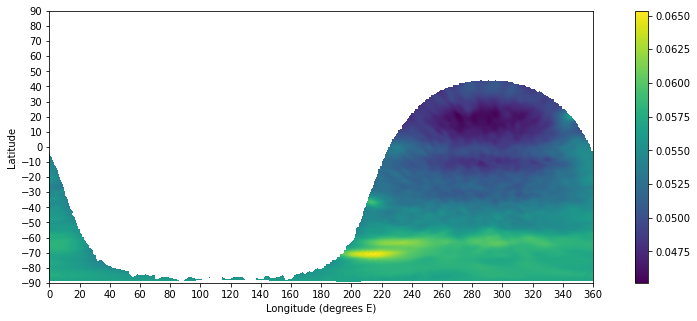

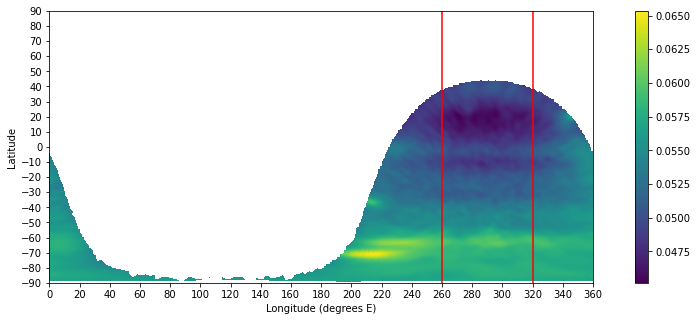

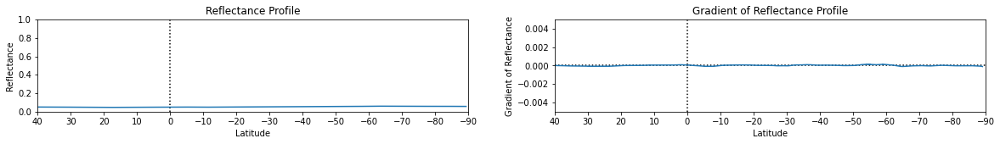

Data Successfully Written to: plotdata/2019_845.csv


In [15]:
good = False
file = get_pkg_data_filename('maps/2019/845_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 260#float(input('Please input the leftmost longitude of the range desired: '))
    right = 320#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2019_845.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

# Year 2018

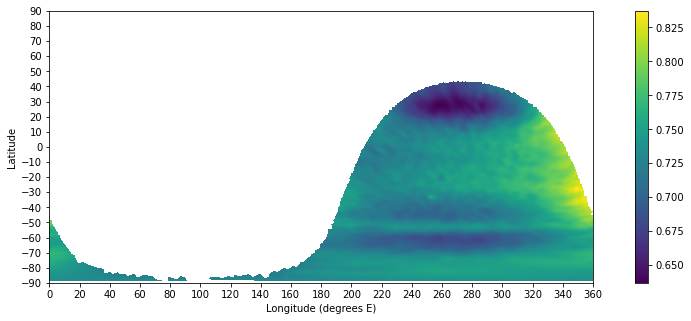

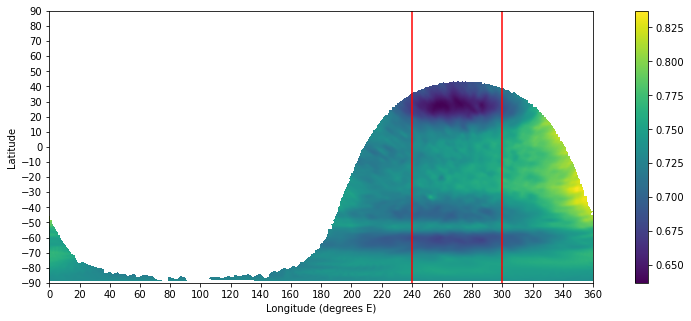

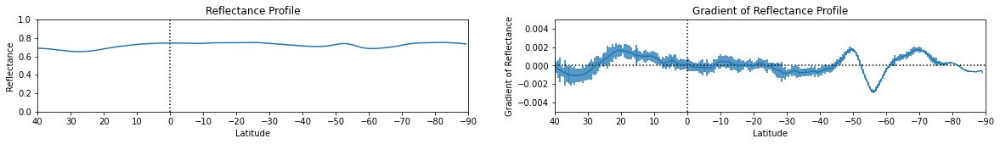

Data Successfully Written to: plotdata/2018_467.csv


In [16]:
good = False
file = get_pkg_data_filename('maps/2018/467_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 240#float(input('Please input the leftmost longitude of the range desired: '))
    right = 300#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2018_467.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

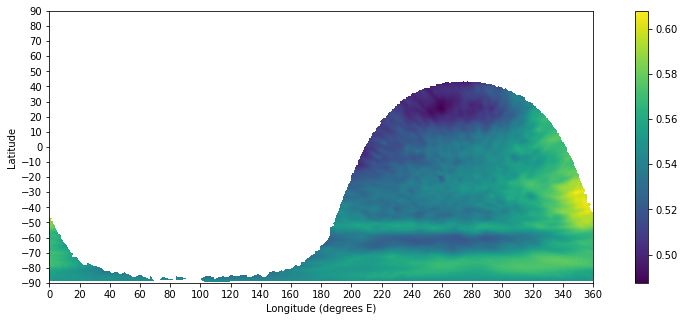

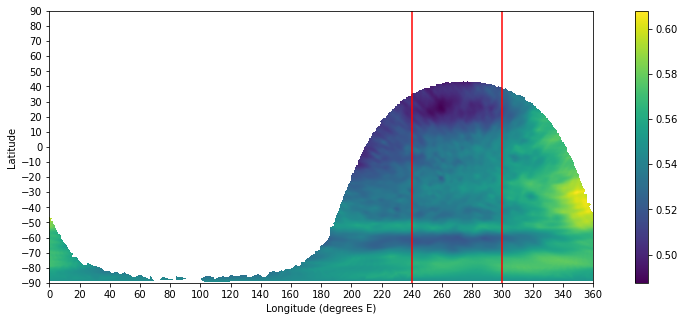

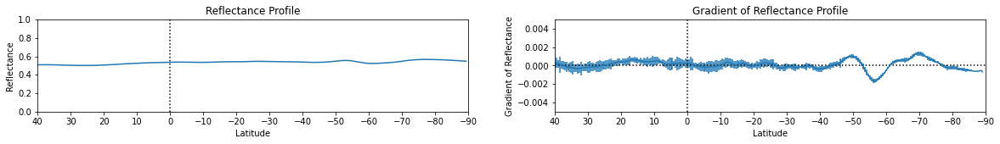

Data Successfully Written to: plotdata/2018_547.csv


In [17]:
good = False
file = get_pkg_data_filename('maps/2018/547_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 240#float(input('Please input the leftmost longitude of the range desired: '))
    right = 300#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2018_547.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

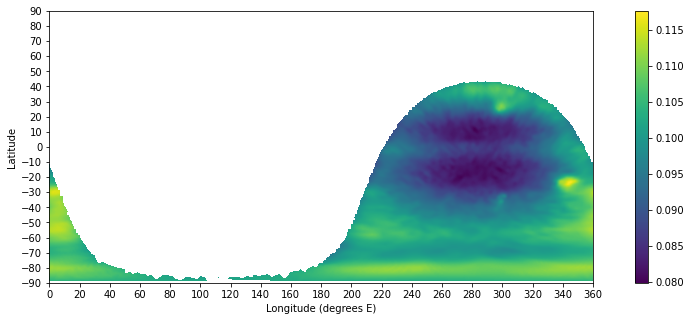

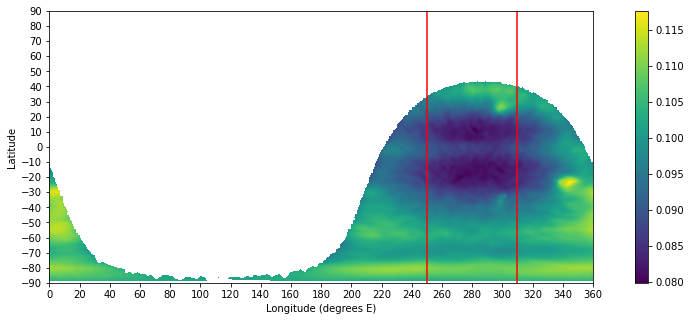

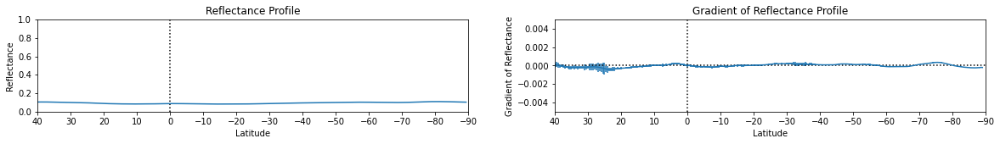

Data Successfully Written to: plotdata/2018_619.csv


In [18]:
good = False
file = get_pkg_data_filename('maps/2018/619_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 250#float(input('Please input the leftmost longitude of the range desired: '))
    right = 310#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2018_619.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

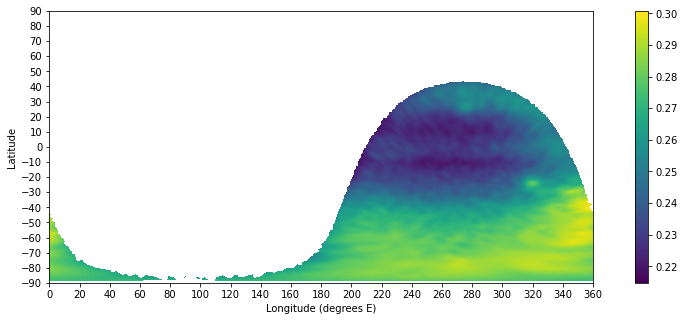

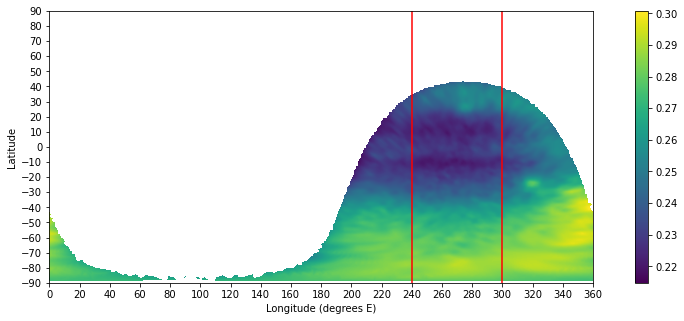

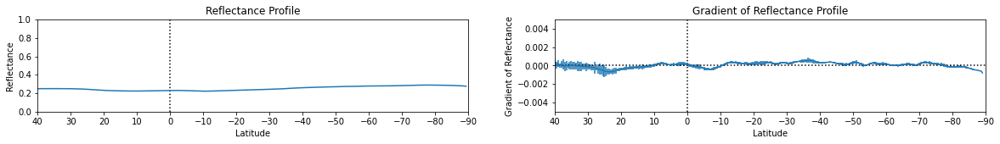

Data Successfully Written to: plotdata/2018_657.csv


In [19]:
good = False
file = get_pkg_data_filename('maps/2018/657_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 240#float(input('Please input the leftmost longitude of the range desired: '))
    right = 300#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2018_657.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

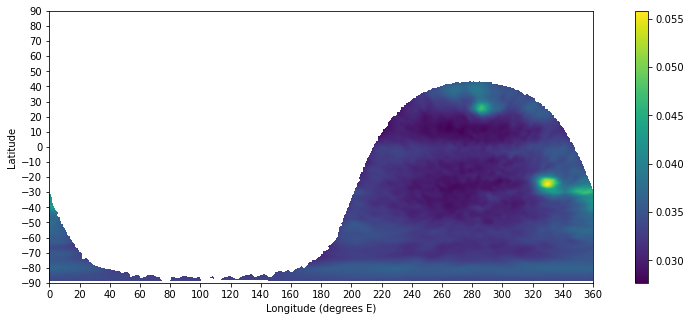

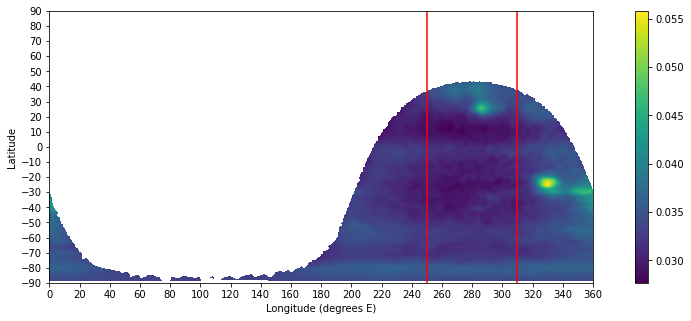

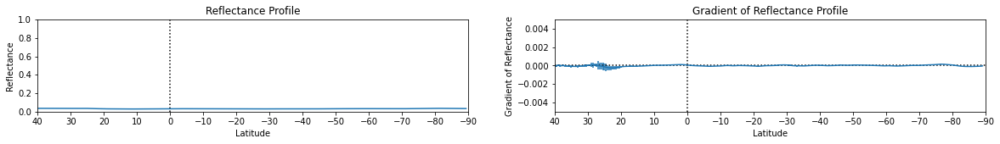

Data Successfully Written to: plotdata/2018_727.csv


In [20]:
good = False
file = get_pkg_data_filename('maps/2018/727_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 250#float(input('Please input the leftmost longitude of the range desired: '))
    right = 310#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2018_727.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

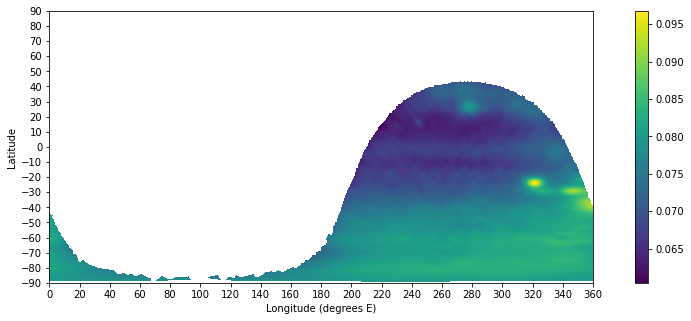

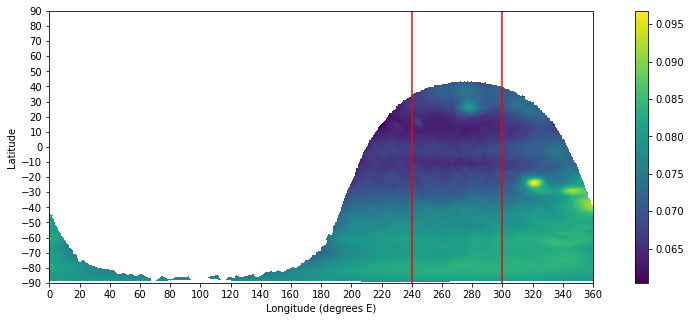

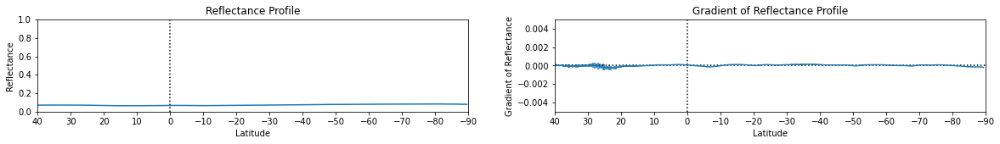

Data Successfully Written to: plotdata/2018_763.csv


In [21]:
good = False
file = get_pkg_data_filename('maps/2018/763_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 240#float(input('Please input the leftmost longitude of the range desired: '))
    right = 300#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2018_763.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

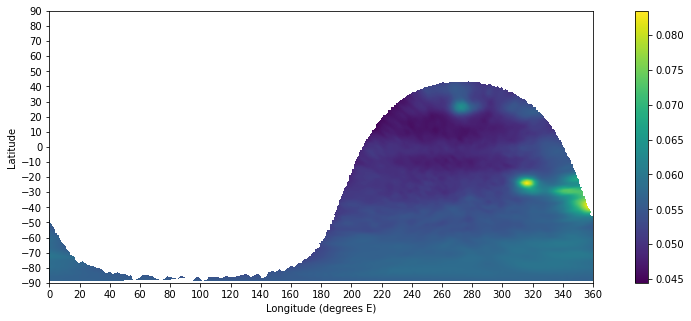

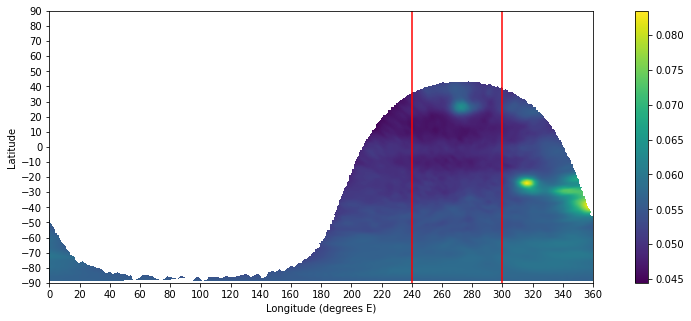

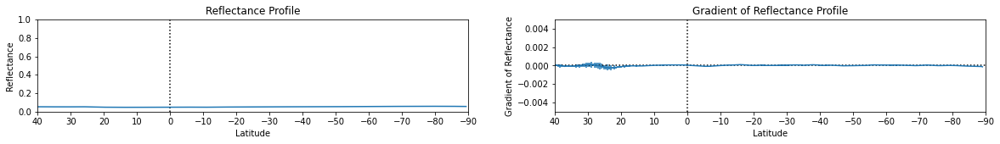

Data Successfully Written to: plotdata/2018_845.csv


In [22]:
good = False
file = get_pkg_data_filename('maps/2018/845_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 240#float(input('Please input the leftmost longitude of the range desired: '))
    right = 300#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2018_845.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

# Year 2017

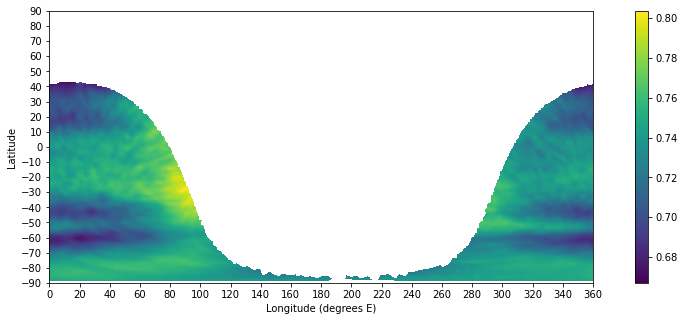

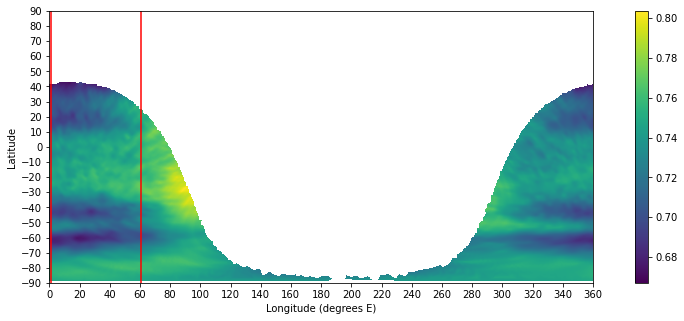

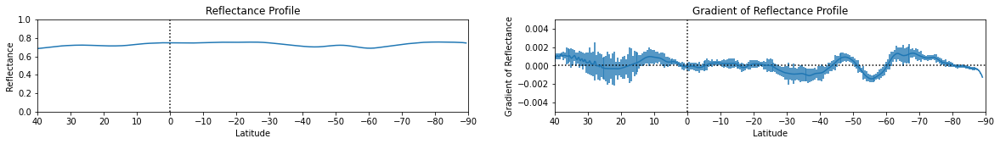

Data Successfully Written to: plotdata/2017_467.csv


In [23]:
good = False
file = get_pkg_data_filename('maps/2017/467_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 1#float(input('Please input the leftmost longitude of the range desired: '))
    right = 61#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2017_467.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

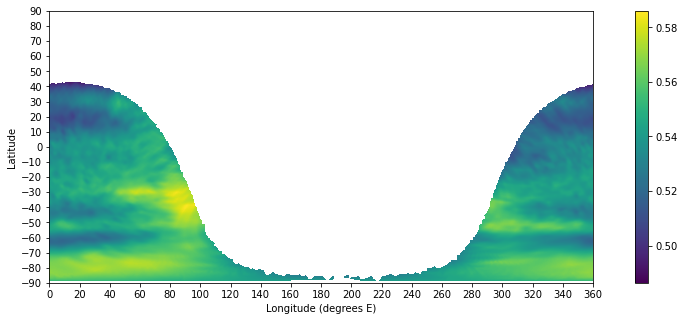

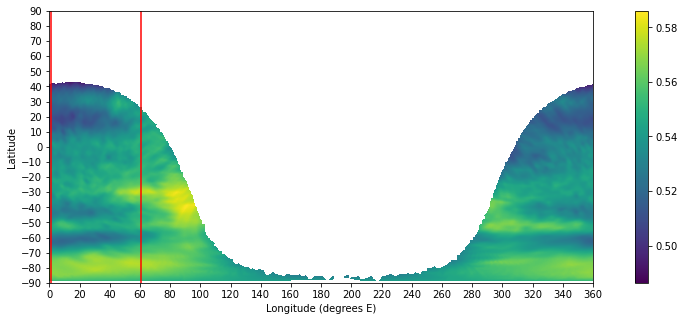

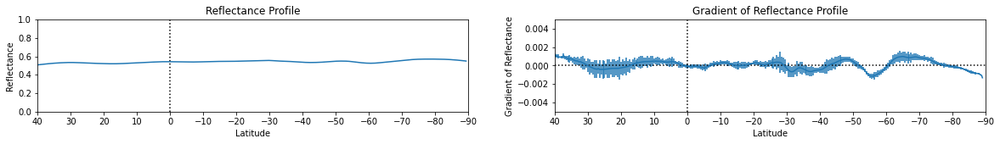

Data Successfully Written to: plotdata/2017_547.csv


In [24]:
good = False
file = get_pkg_data_filename('maps/2017/547_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 1#float(input('Please input the leftmost longitude of the range desired: '))
    right = 61#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2017_547.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

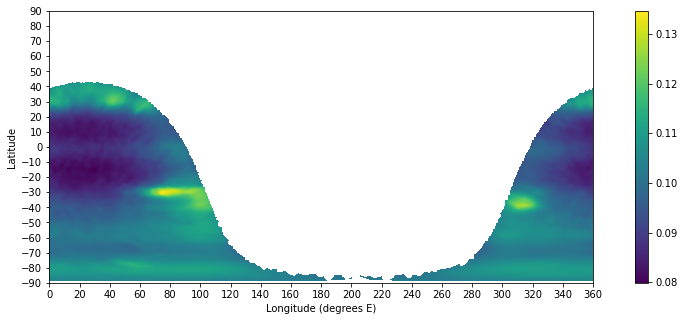

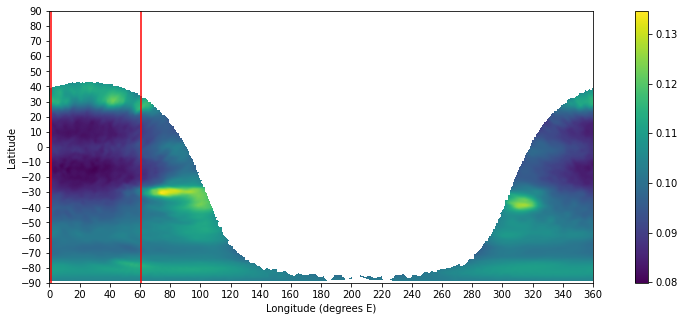

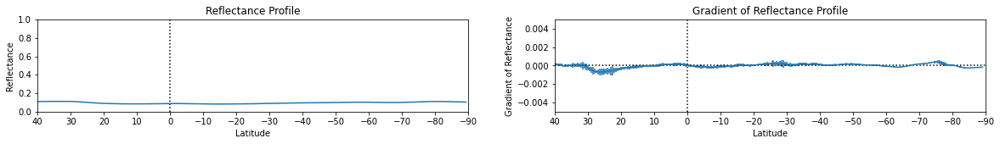

Data Successfully Written to: plotdata/2017_619.csv


In [25]:
good = False
file = get_pkg_data_filename('maps/2017/619_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 1#float(input('Please input the leftmost longitude of the range desired: '))
    right = 61#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2017_619.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

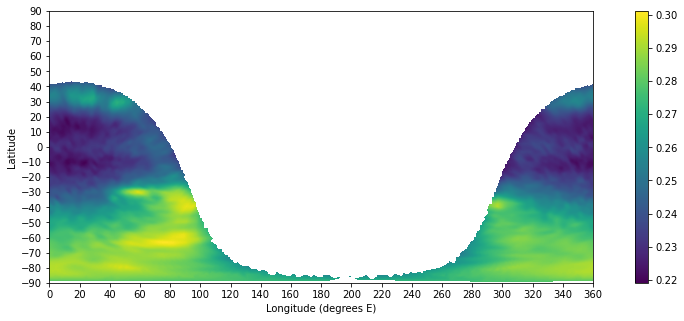

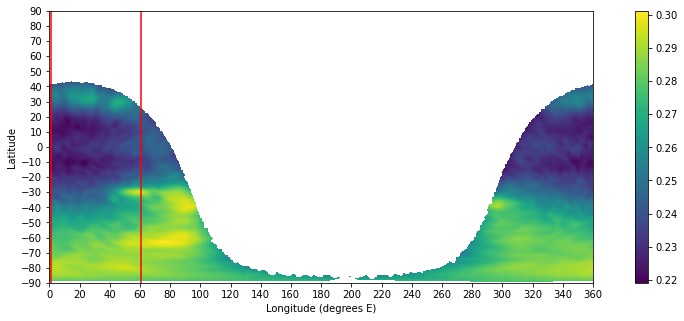

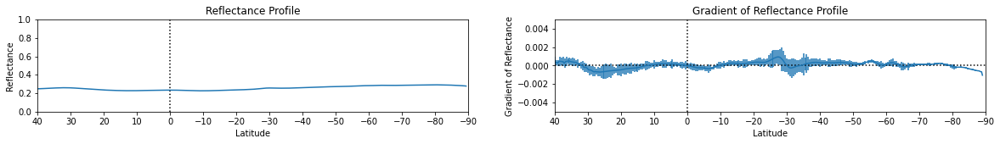

Data Successfully Written to: plotdata/2017_657.csv


In [26]:
good = False
file = get_pkg_data_filename('maps/2017/657_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 1#float(input('Please input the leftmost longitude of the range desired: '))
    right = 61#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2017_657.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

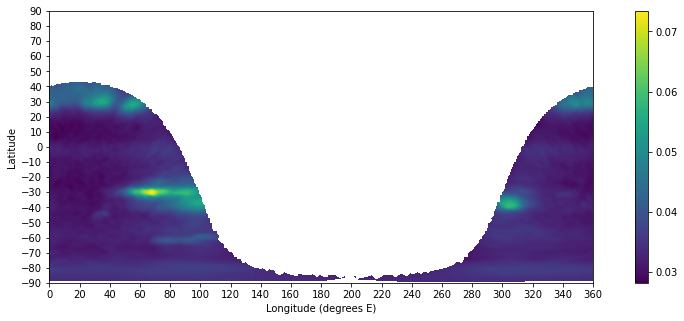

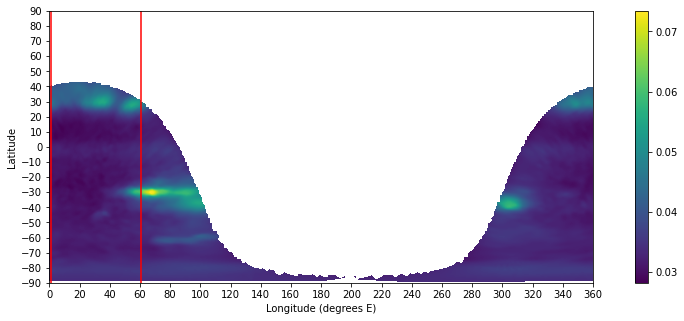

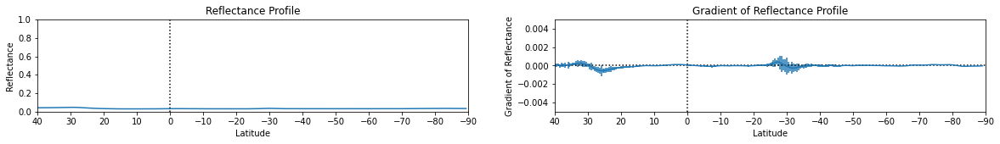

Data Successfully Written to: plotdata/2017_727.csv


In [27]:
good = False
file = get_pkg_data_filename('maps/2017/727_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 1#float(input('Please input the leftmost longitude of the range desired: '))
    right = 61#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2017_727.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

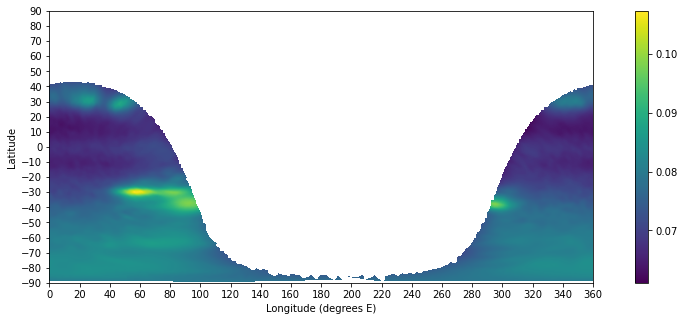

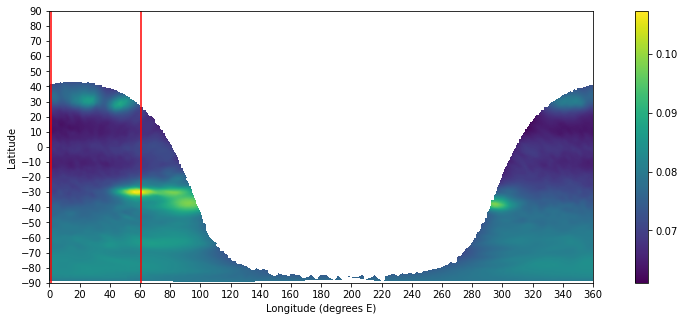

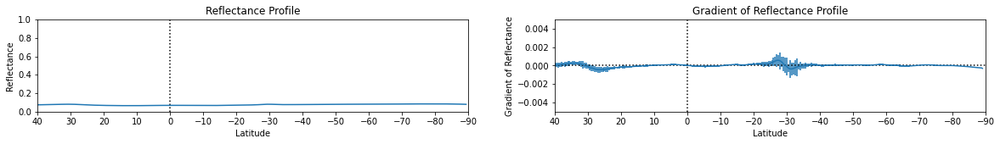

Data Successfully Written to: plotdata/2017_763.csv


In [28]:
good = False
file = get_pkg_data_filename('maps/2017/763_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 1#float(input('Please input the leftmost longitude of the range desired: '))
    right = 61#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2017_763.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

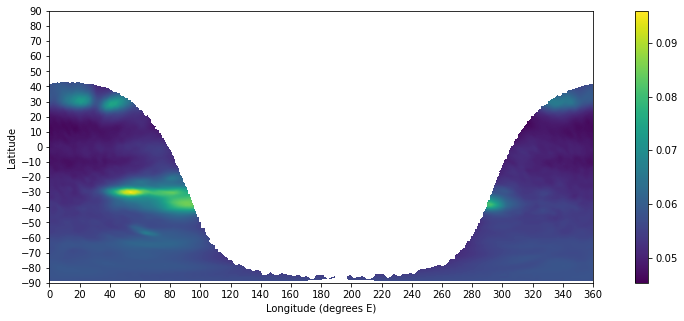

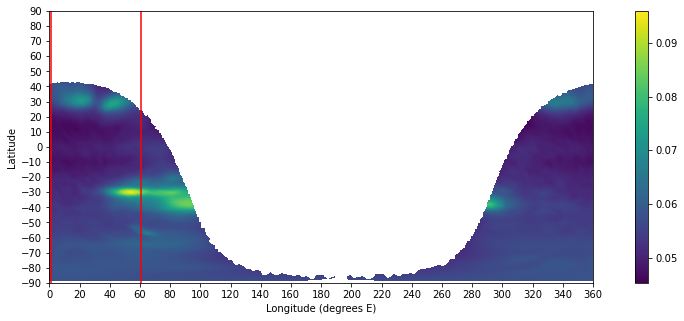

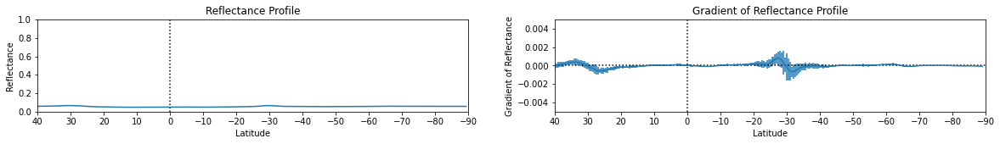

Data Successfully Written to: plotdata/2017_845.csv


In [29]:
good = False
file = get_pkg_data_filename('maps/2017/845_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 1#float(input('Please input the leftmost longitude of the range desired: '))
    right = 61#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2017_845.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

# Year 2016

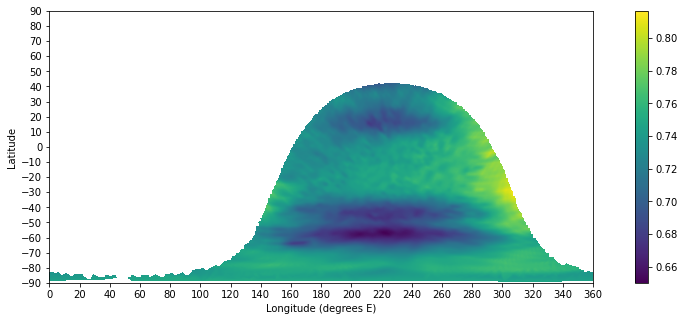

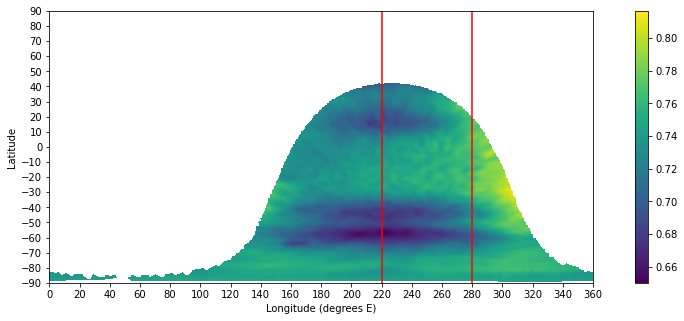

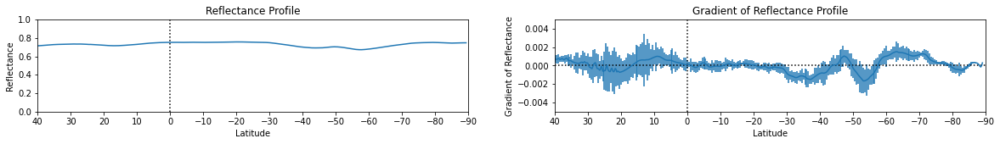

Data Successfully Written to: plotdata/2016_467.csv


In [30]:
good = False
file = get_pkg_data_filename('maps/2016/467_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 220#float(input('Please input the leftmost longitude of the range desired: '))
    right = 280#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2016_467.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

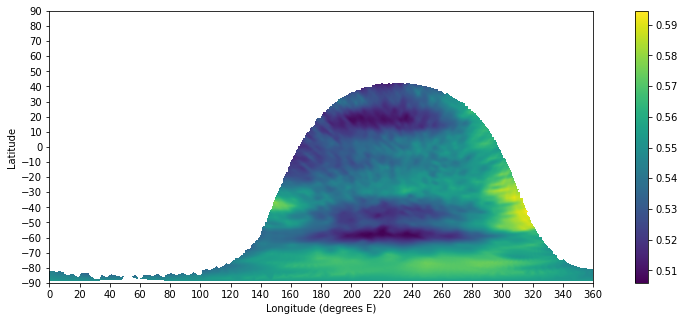

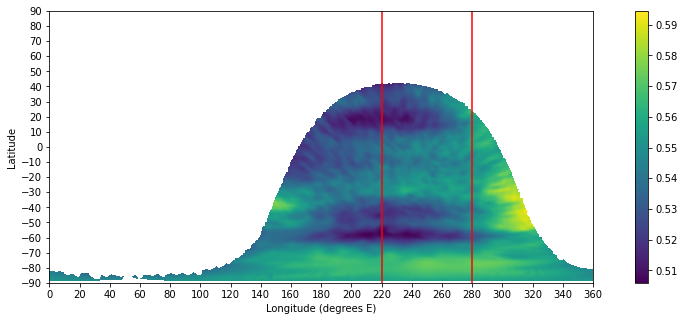

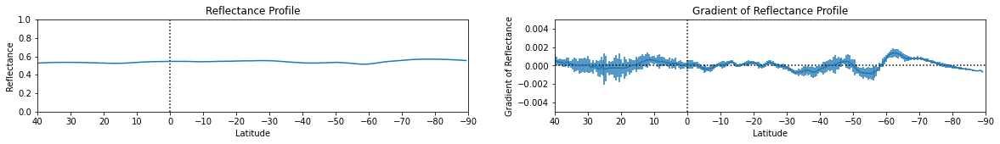

Data Successfully Written to: plotdata/2016_547.csv


In [31]:
good = False
file = get_pkg_data_filename('maps/2016/547_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 220#float(input('Please input the leftmost longitude of the range desired: '))
    right = 280#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2016_547.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

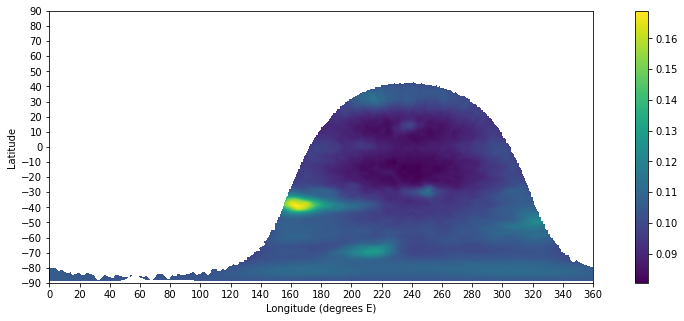

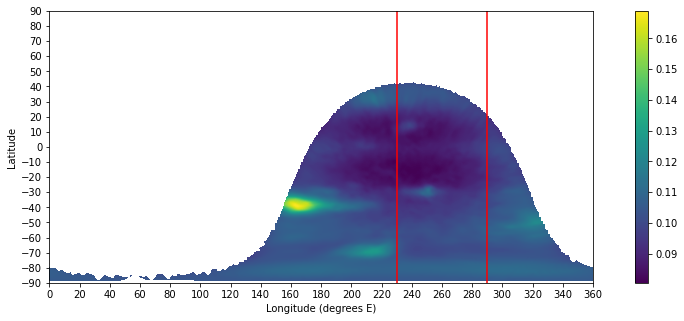

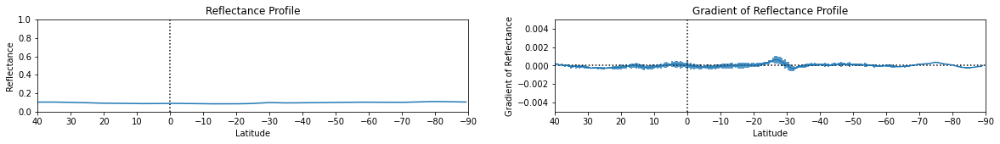

Data Successfully Written to: plotdata/2016_619.csv


In [32]:
good = False
file = get_pkg_data_filename('maps/2016/619_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 230#float(input('Please input the leftmost longitude of the range desired: '))
    right = 290#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2016_619.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

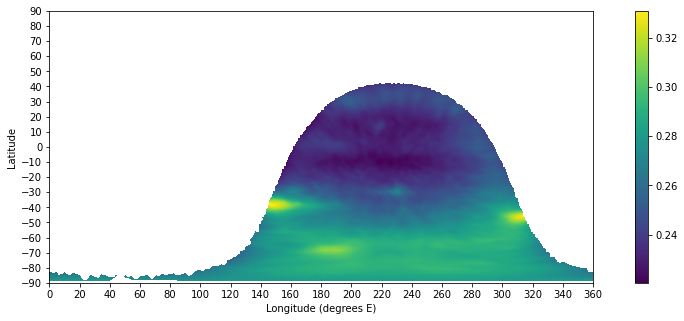

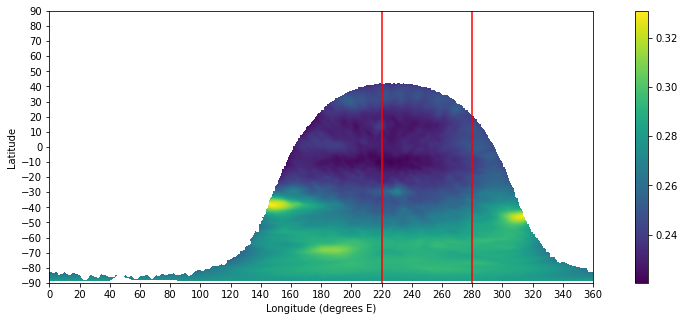

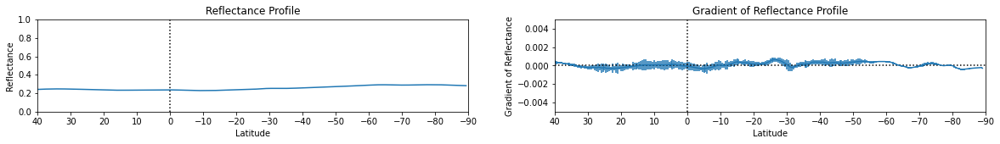

Data Successfully Written to: plotdata/2016_657.csv


In [33]:
good = False
file = get_pkg_data_filename('maps/2016/657_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 220#float(input('Please input the leftmost longitude of the range desired: '))
    right = 280#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2016_657.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

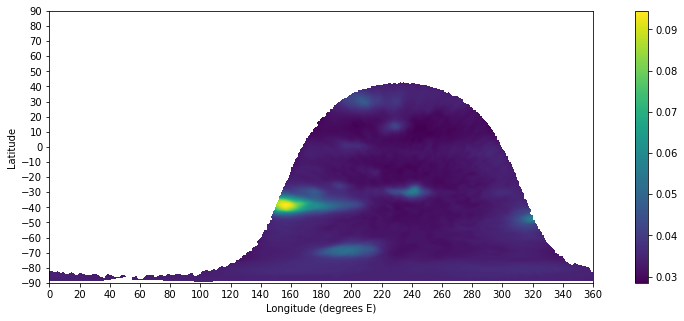

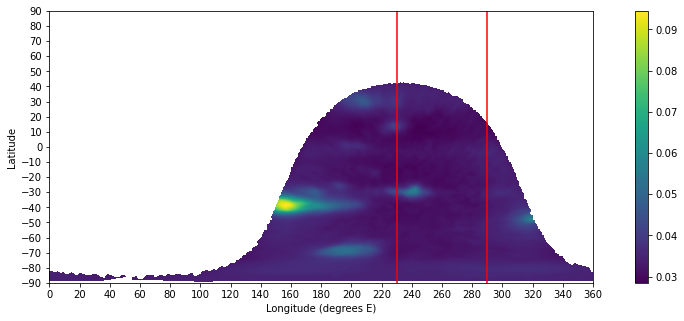

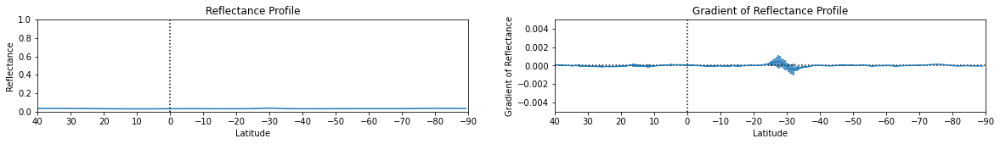

Data Successfully Written to: plotdata/2016_727.csv


In [34]:
good = False
file = get_pkg_data_filename('maps/2016/727_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 230#float(input('Please input the leftmost longitude of the range desired: '))
    right = 290#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2016_727.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

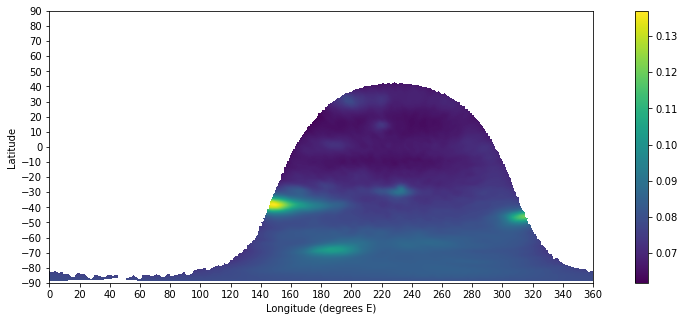

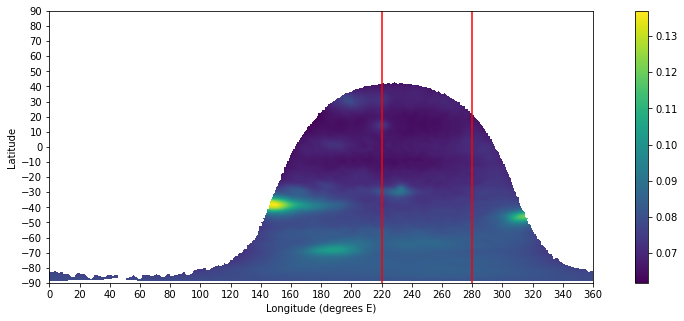

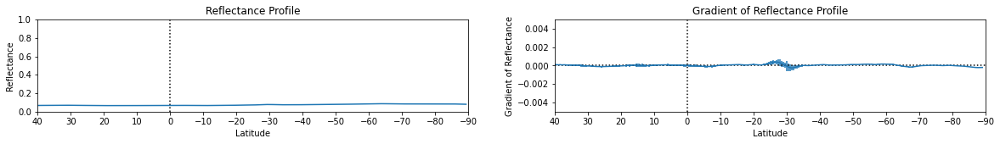

Data Successfully Written to: plotdata/2016_763.csv


In [35]:
good = False
file = get_pkg_data_filename('maps/2016/763_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 220#float(input('Please input the leftmost longitude of the range desired: '))
    right = 280#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2016_763.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

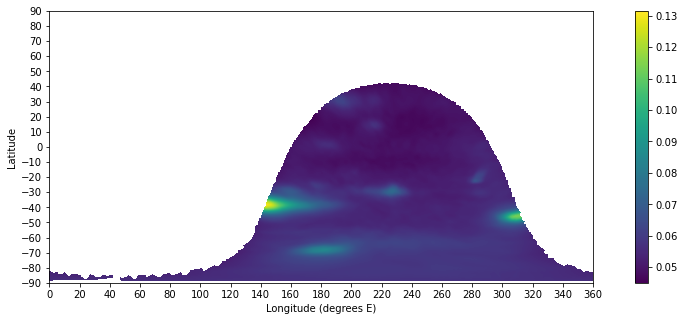

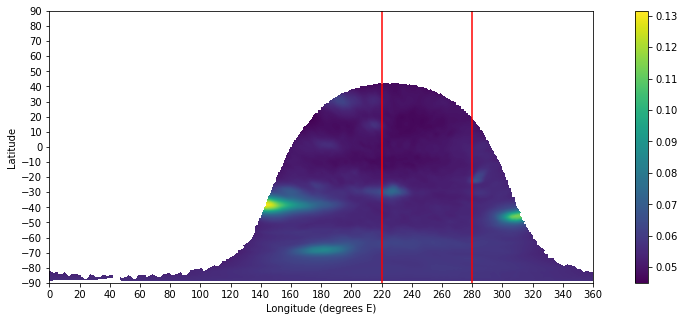

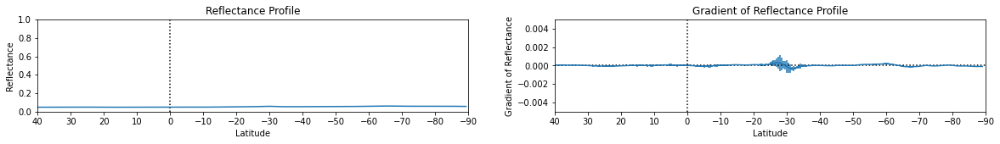

Data Successfully Written to: plotdata/2016_845.csv


In [36]:
good = False
file = get_pkg_data_filename('maps/2016/845_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 220#float(input('Please input the leftmost longitude of the range desired: '))
    right = 280#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2016_845.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

# Year 2015

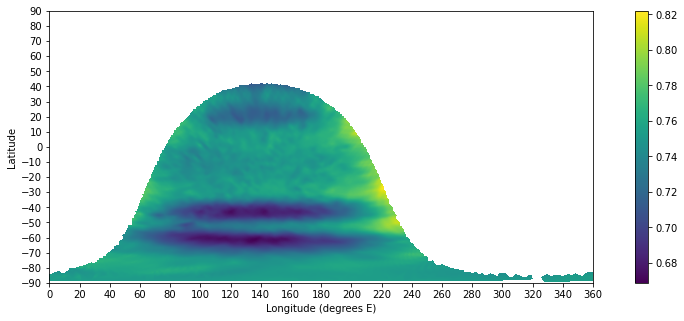

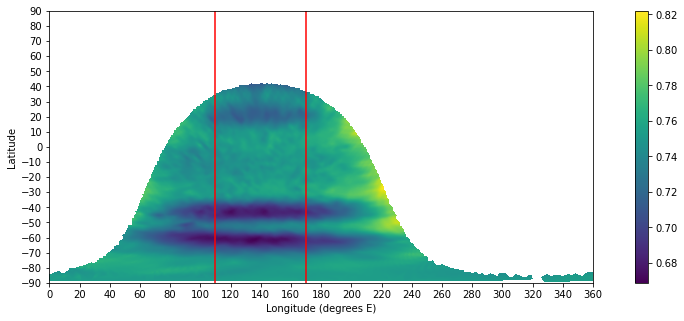

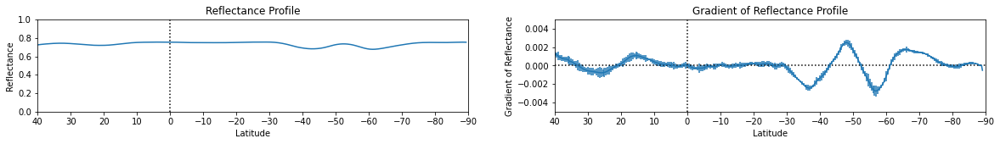

Data Successfully Written to: plotdata/2015_467.csv


In [37]:
good = False
file = get_pkg_data_filename('maps/2015/467_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 110#float(input('Please input the leftmost longitude of the range desired: '))
    right = 170#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2015_467.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

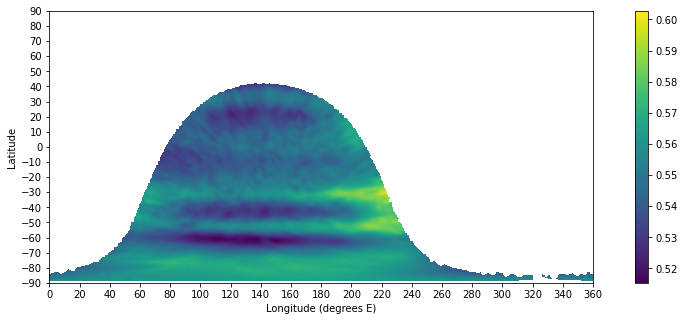

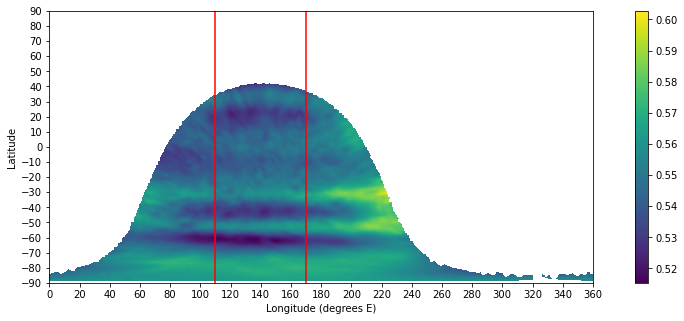

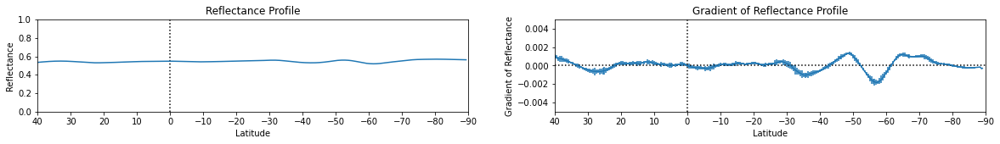

Data Successfully Written to: plotdata/2015_547.csv


In [38]:
good = False
file = get_pkg_data_filename('maps/2015/547_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 110#float(input('Please input the leftmost longitude of the range desired: '))
    right = 170#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2015_547.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

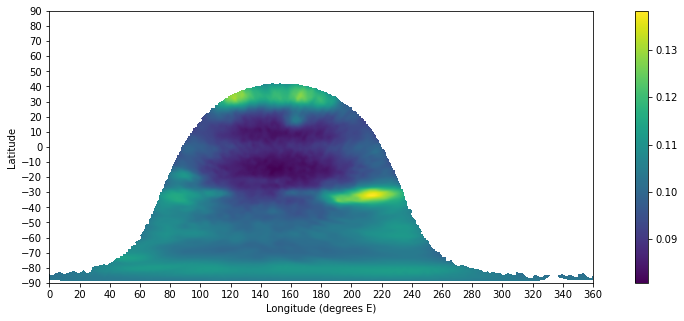

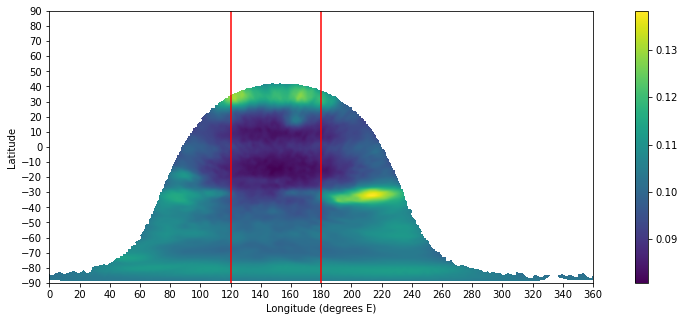

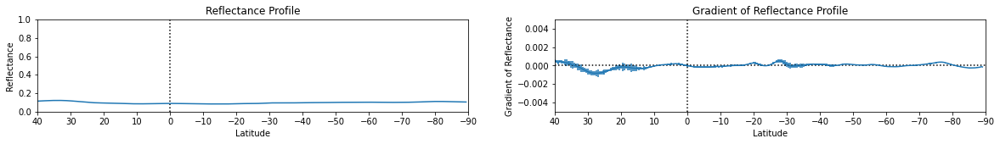

Data Successfully Written to: plotdata/2015_619.csv


In [39]:
good = False
file = get_pkg_data_filename('maps/2015/619_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 120#float(input('Please input the leftmost longitude of the range desired: '))
    right = 180#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2015_619.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

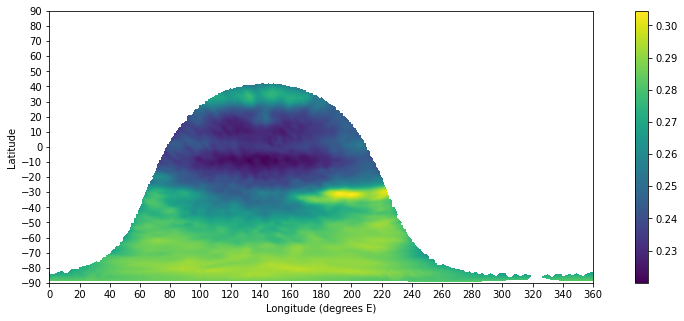

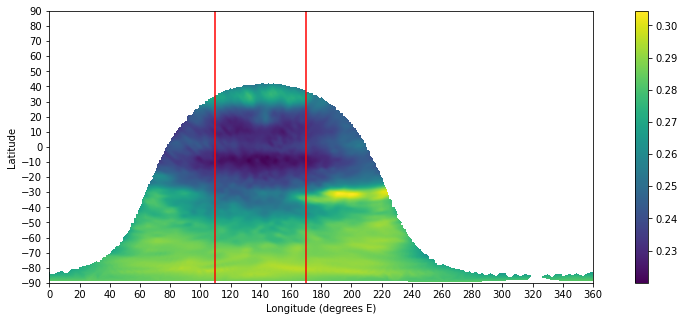

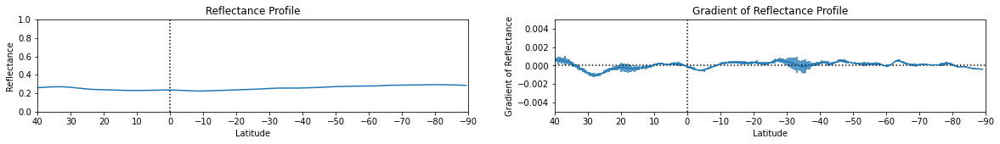

Data Successfully Written to: plotdata/2015_657.csv


In [40]:
good = False
file = get_pkg_data_filename('maps/2015/657_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 110#float(input('Please input the leftmost longitude of the range desired: '))
    right = 170#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2015_657.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

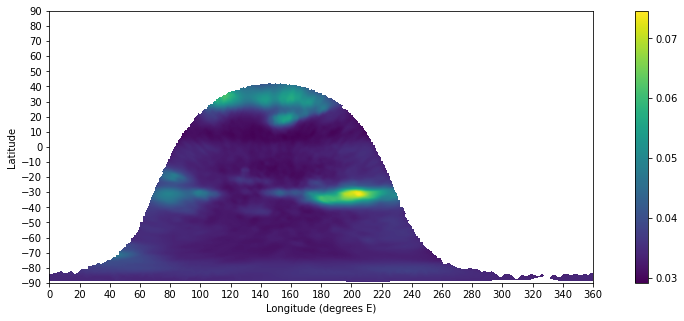

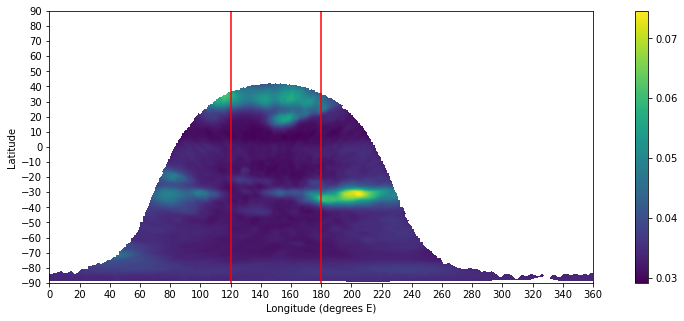

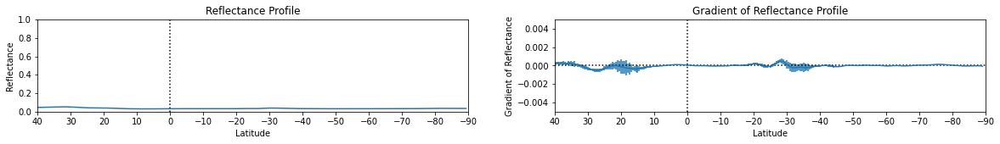

Data Successfully Written to: plotdata/2015_727.csv


In [41]:
good = False
file = get_pkg_data_filename('maps/2015/727_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 120#float(input('Please input the leftmost longitude of the range desired: '))
    right = 180#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2015_727.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

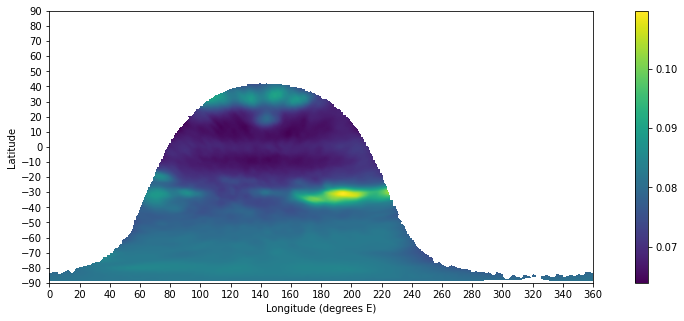

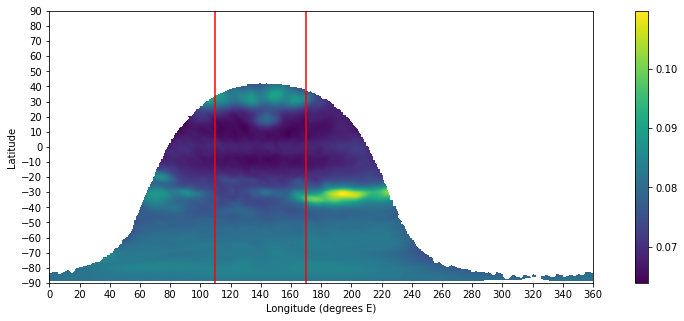

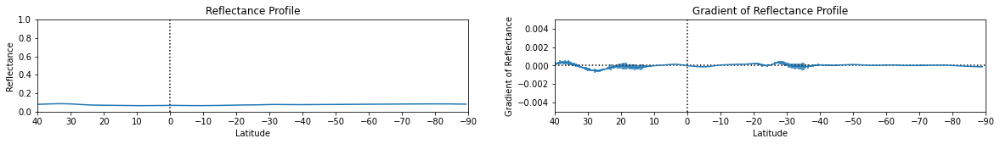

Data Successfully Written to: plotdata/2015_763.csv


In [42]:
good = False
file = get_pkg_data_filename('maps/2015/763_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 110#float(input('Please input the leftmost longitude of the range desired: '))
    right = 170#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2015_763.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

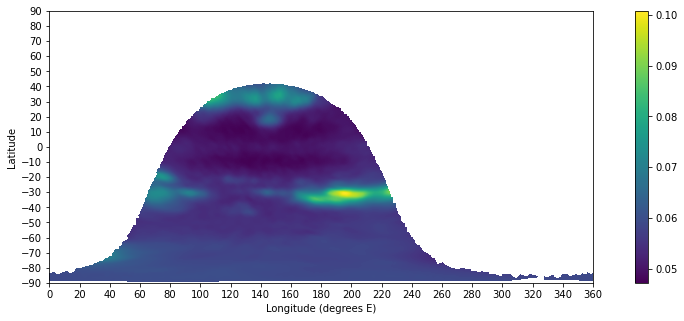

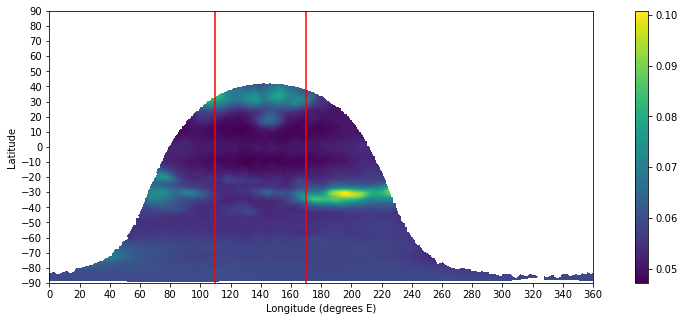

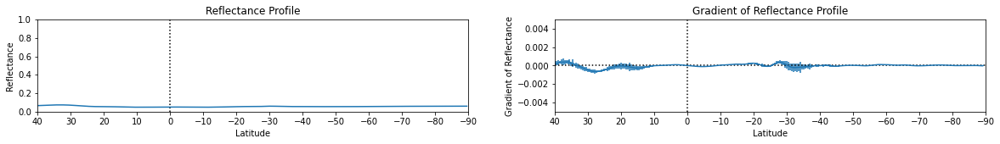

Data Successfully Written to: plotdata/2015_845.csv


In [43]:
good = False
file = get_pkg_data_filename('maps/2015/845_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 110#float(input('Please input the leftmost longitude of the range desired: '))
    right = 170#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2015_845.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

# Year 2011

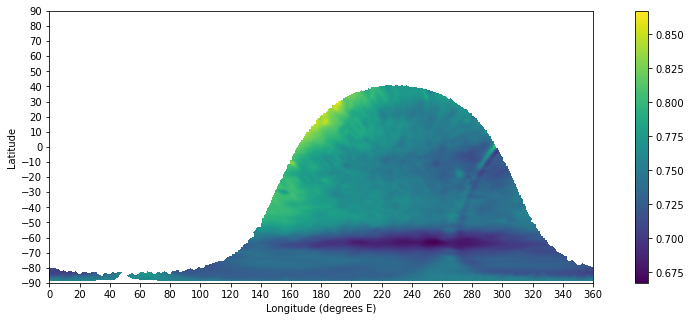

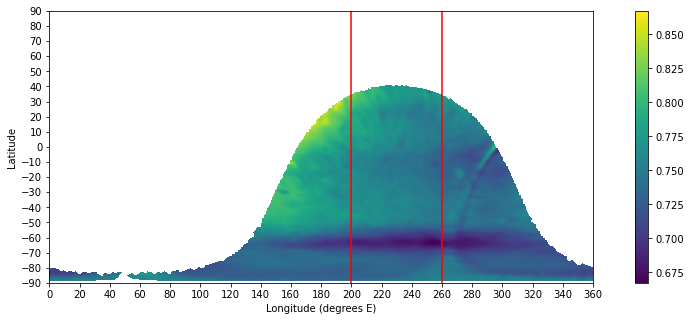

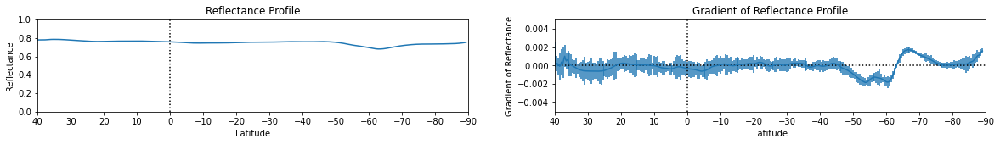

Data Successfully Written to: plotdata/2011_467.csv


In [44]:
good = False
file = get_pkg_data_filename('maps/2011/467_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 200#float(input('Please input the leftmost longitude of the range desired: '))
    right = 260#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2011_467.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

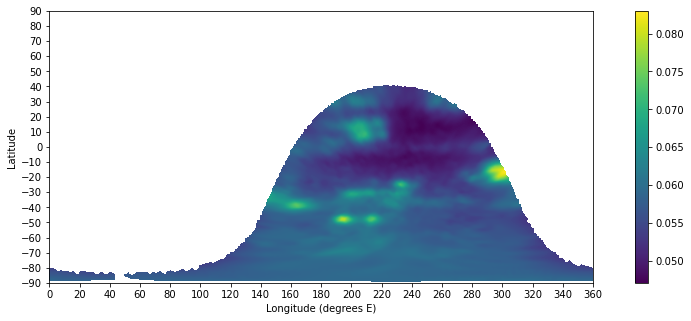

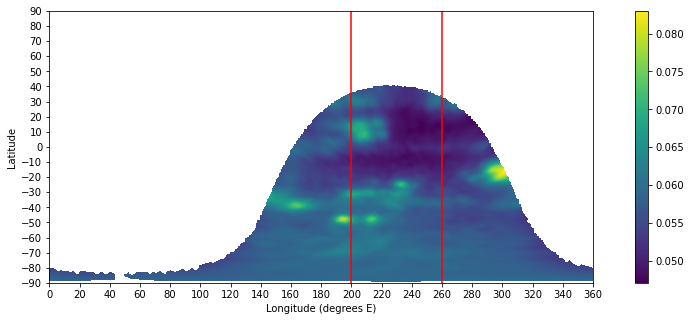

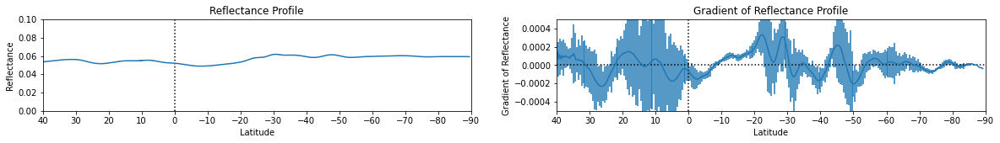

Data Successfully Written to: plotdata/2011_845.csv


In [45]:
good = False
file = get_pkg_data_filename('maps/2011/845_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 200#float(input('Please input the leftmost longitude of the range desired: '))
    right = 260#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,0.1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.0005,0.0005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2011_845.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

# Year 2010

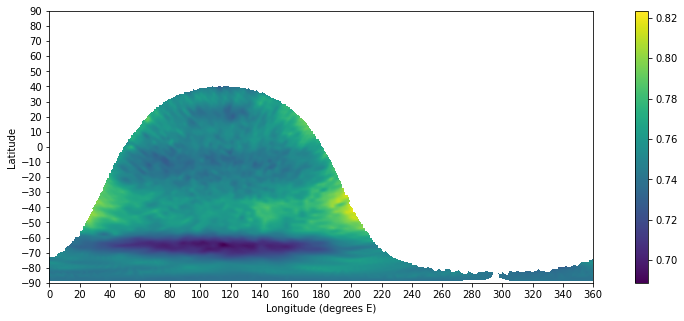

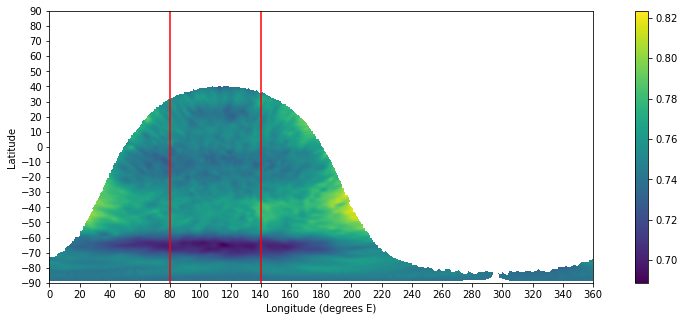

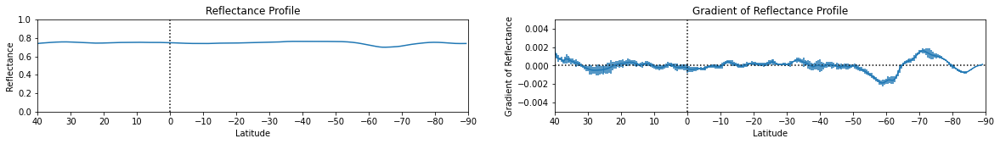

Data Successfully Written to: plotdata/2010_467.csv


In [46]:
good = False
file = get_pkg_data_filename('maps/2010/467_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 80#float(input('Please input the leftmost longitude of the range desired: '))
    right = 140#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2010_467.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

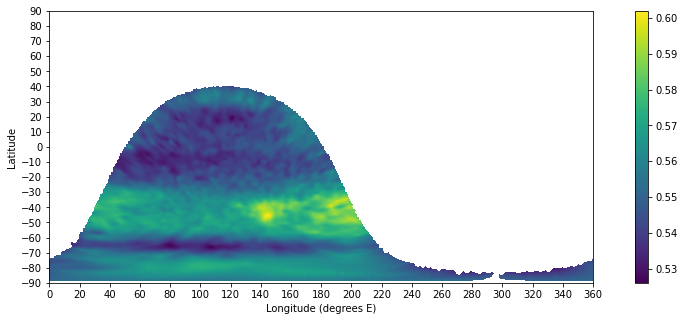

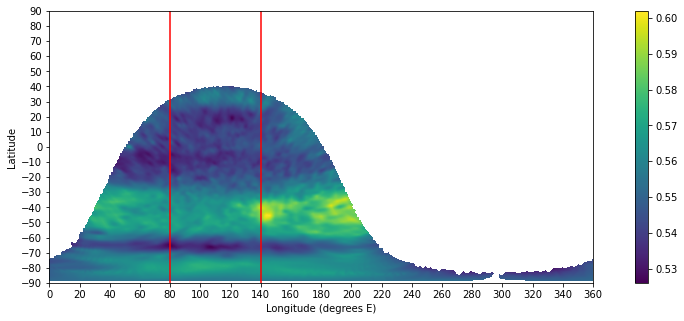

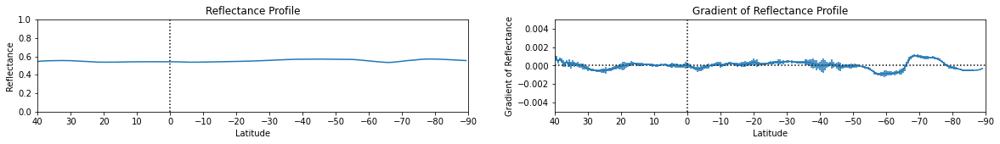

Data Successfully Written to: plotdata/2010_547.csv


In [47]:
good = False
file = get_pkg_data_filename('maps/2010/547_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 80#float(input('Please input the leftmost longitude of the range desired: '))
    right = 140#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2010_547.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

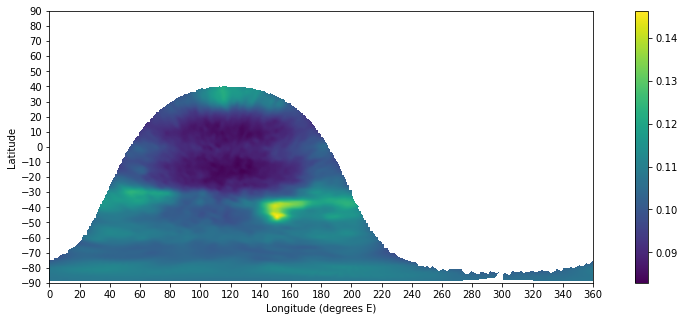

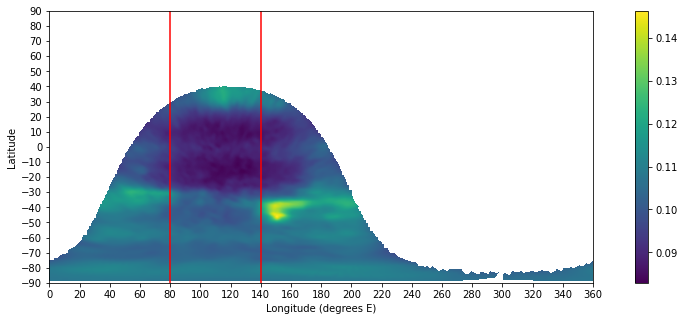

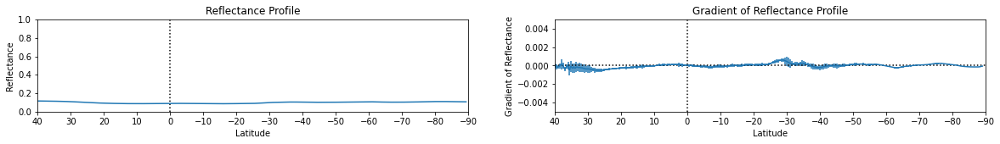

Data Successfully Written to: plotdata/2010_619.csv


In [48]:
good = False
file = get_pkg_data_filename('maps/2010/619_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 80#float(input('Please input the leftmost longitude of the range desired: '))
    right = 140#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2010_619.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

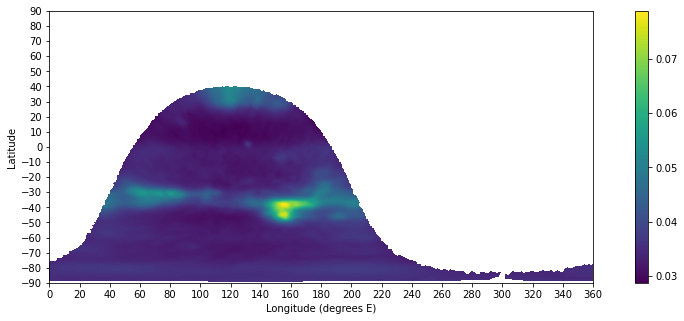

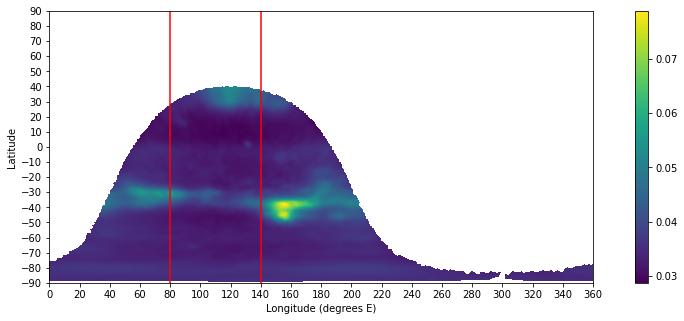

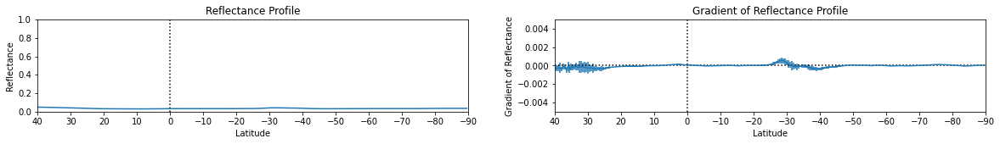

Data Successfully Written to: plotdata/2010_727.csv


In [49]:
good = False
file = get_pkg_data_filename('maps/2010/727_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 80#float(input('Please input the leftmost longitude of the range desired: '))
    right = 140#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2010_727.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

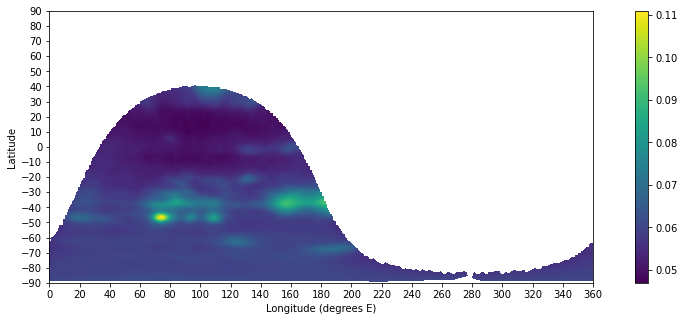

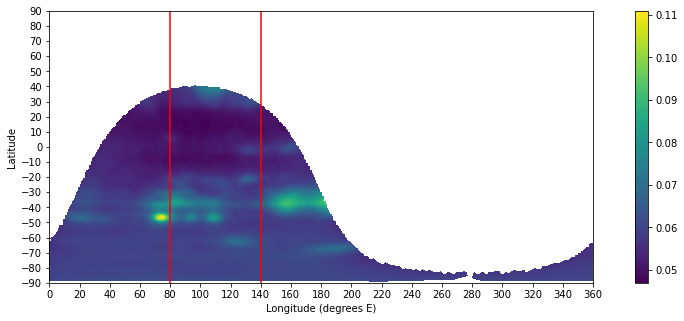

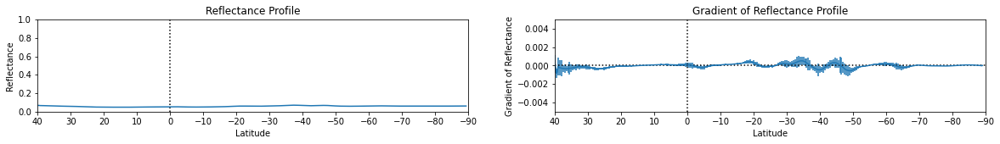

Data Successfully Written to: plotdata/2010_845.csv


In [50]:
good = False
file = get_pkg_data_filename('maps/2010/845_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 80#float(input('Please input the leftmost longitude of the range desired: '))
    right = 140#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2010_845.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

# Year 2009

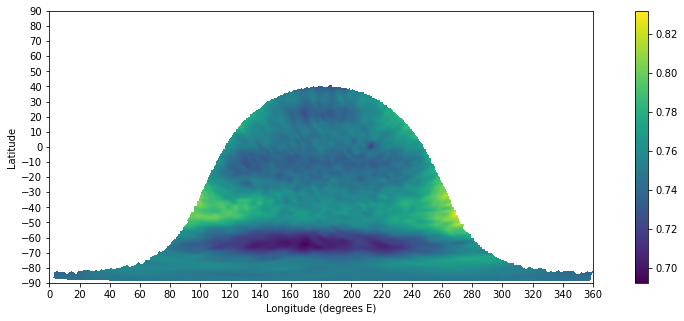

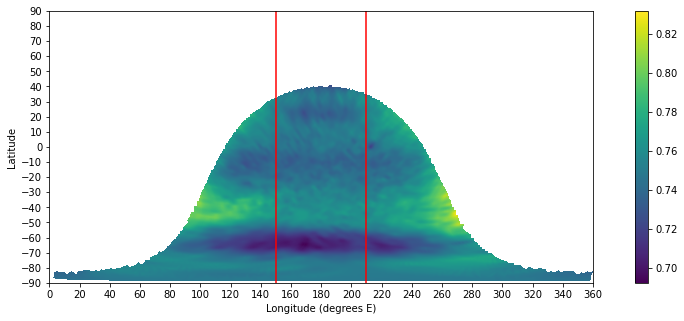

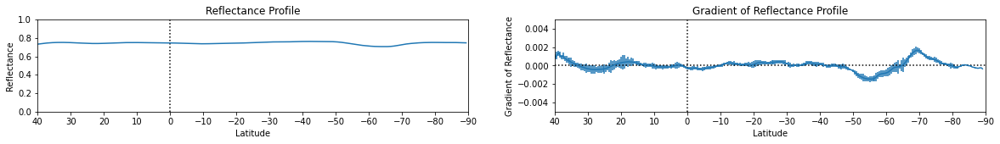

Data Successfully Written to: plotdata/2009_467.csv


In [51]:
good = False
file = get_pkg_data_filename('maps/2009/467_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 150#float(input('Please input the leftmost longitude of the range desired: '))
    right = 210#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2009_467.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

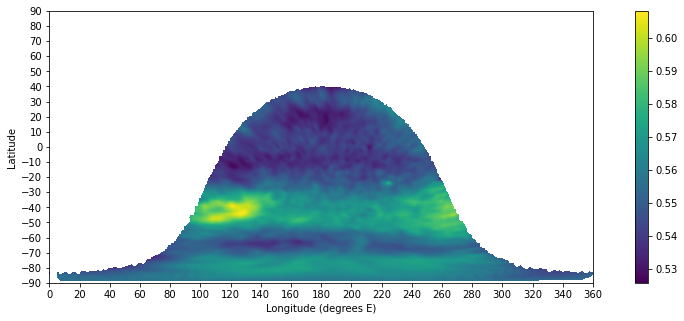

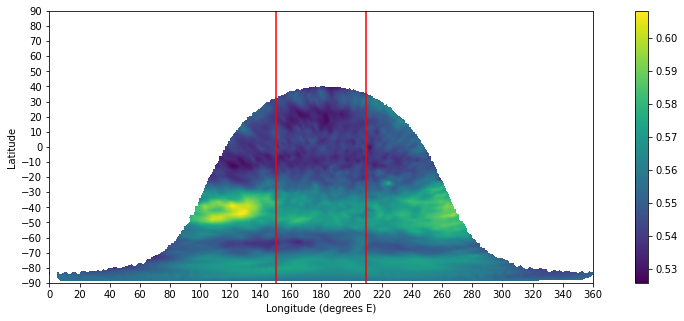

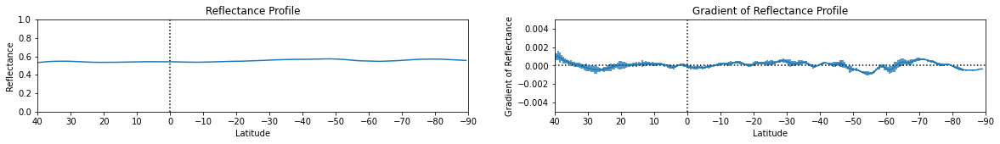

Data Successfully Written to: plotdata/2009_547.csv


In [52]:
good = False
file = get_pkg_data_filename('maps/2009/547_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 150#float(input('Please input the leftmost longitude of the range desired: '))
    right = 210#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2009_547.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

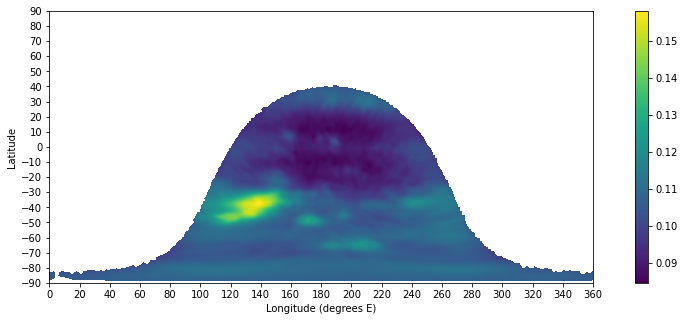

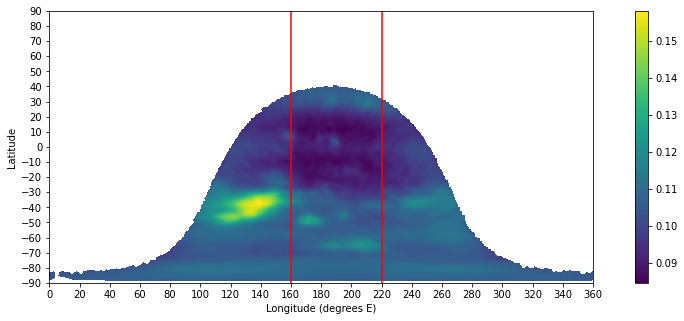

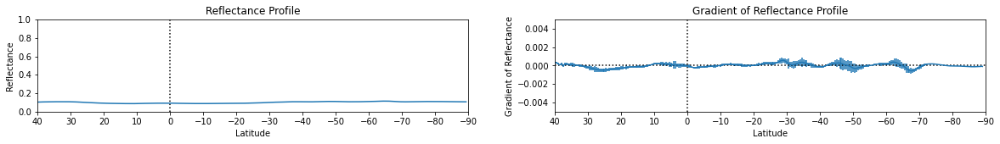

Data Successfully Written to: plotdata/2009_619.csv


In [53]:
good = False
file = get_pkg_data_filename('maps/2009/619_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 160#float(input('Please input the leftmost longitude of the range desired: '))
    right = 220#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2009_619.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

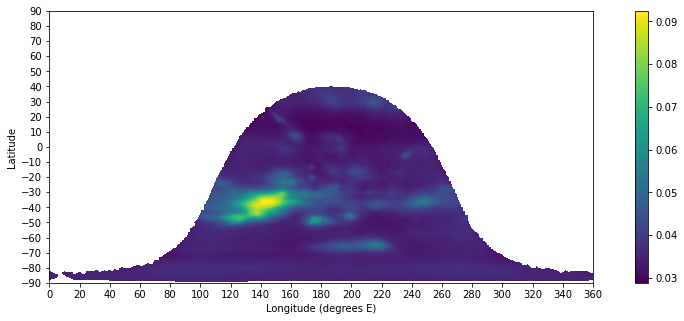

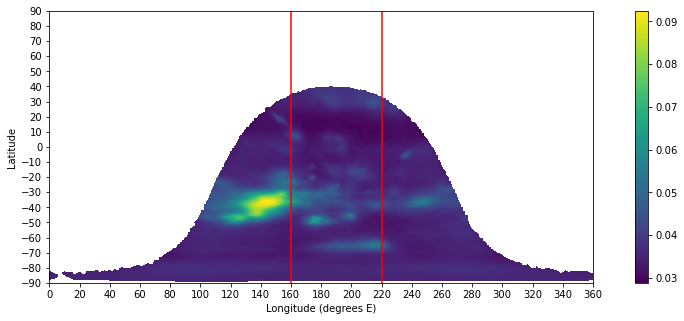

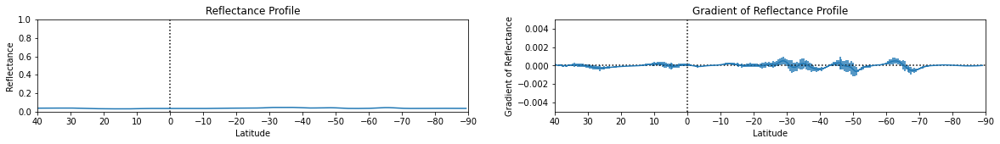

Data Successfully Written to: plotdata/2009_727.csv


In [54]:
good = False
file = get_pkg_data_filename('maps/2009/727_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 160#float(input('Please input the leftmost longitude of the range desired: '))
    right = 220#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True
img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2009_727.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

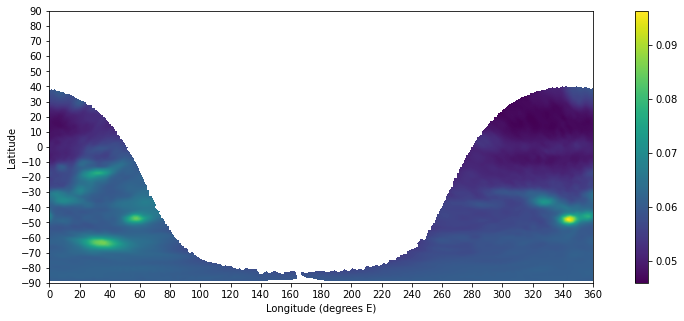

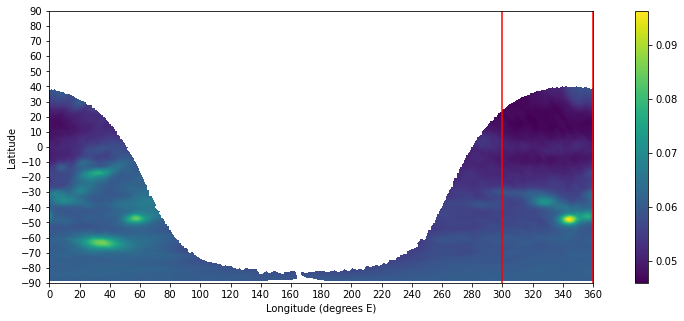

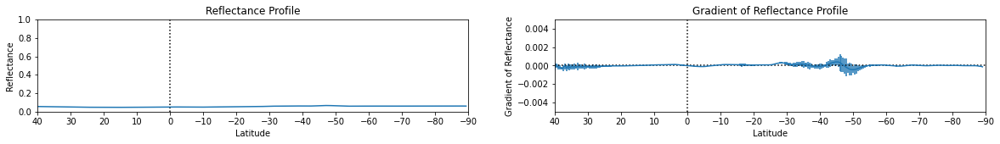

Data Successfully Written to: plotdata/2009_845.csv


In [55]:
good = False
file = get_pkg_data_filename('maps/2009/845_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 300#float(input('Please input the leftmost longitude of the range desired: '))
    right = 360#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2009_845.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

# Year 2008

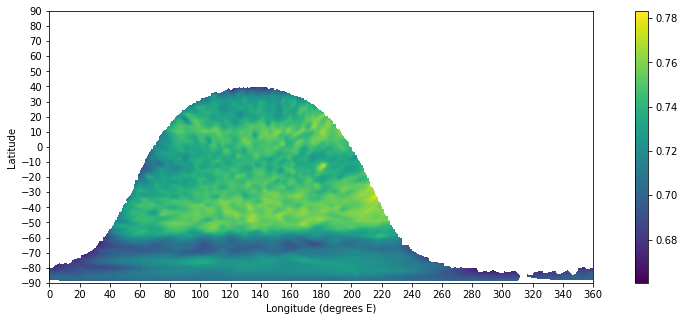

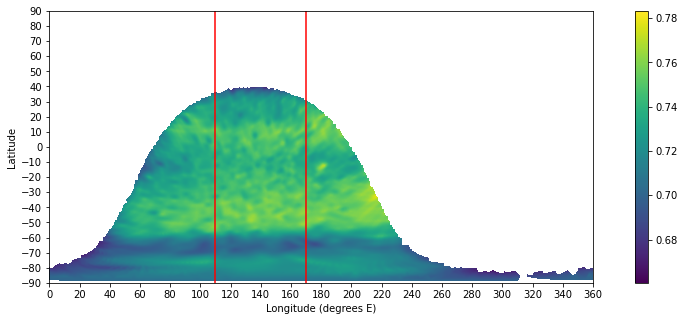

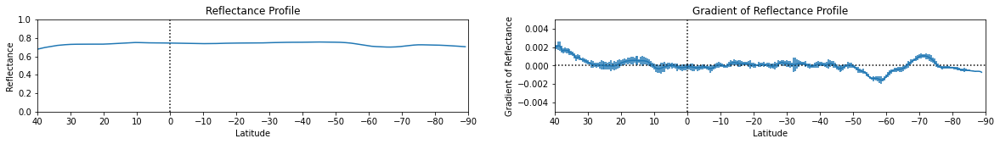

Data Successfully Written to: plotdata/2008_467.csv


In [56]:
good = False
file = get_pkg_data_filename('maps/2008/467_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 110#float(input('Please input the leftmost longitude of the range desired: '))
    right = 170#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2008_467.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

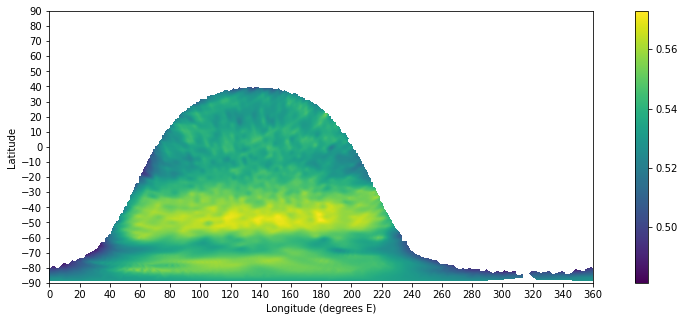

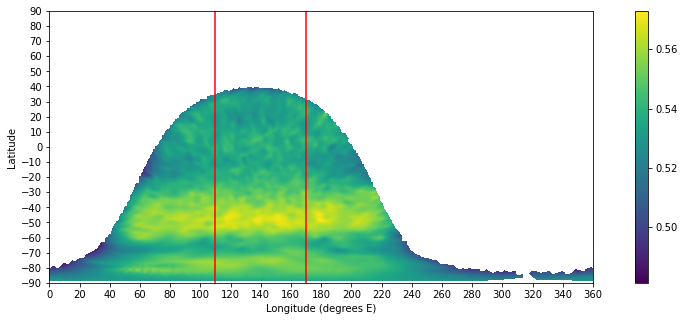

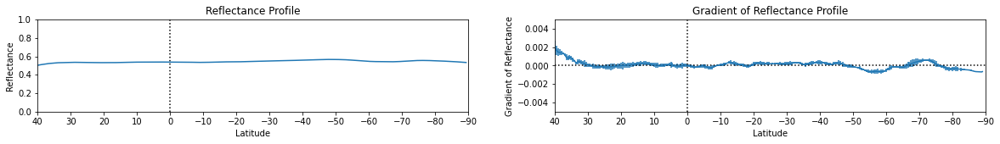

Data Successfully Written to: plotdata/2008_547.csv


In [57]:
good = False
file = get_pkg_data_filename('maps/2008/547_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 110#float(input('Please input the leftmost longitude of the range desired: '))
    right = 170#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2008_547.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

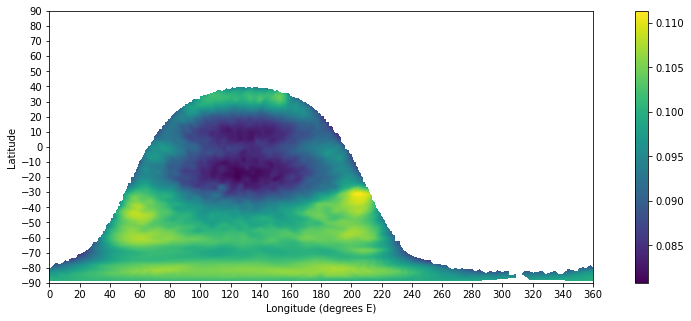

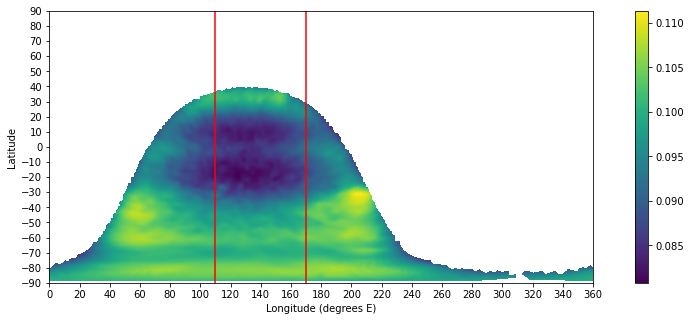

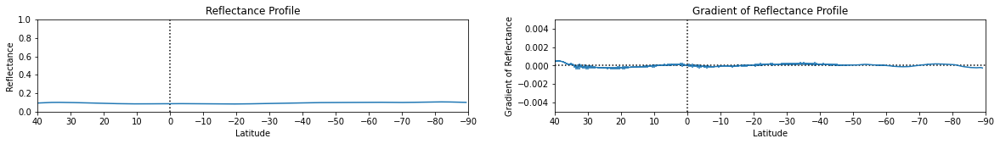

Data Successfully Written to: plotdata/2008_CH4.csv


In [58]:
good = False
file = get_pkg_data_filename('maps/2008/CH4_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 110#float(input('Please input the leftmost longitude of the range desired: '))
    right = 170#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2008_CH4.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

# Year 2007

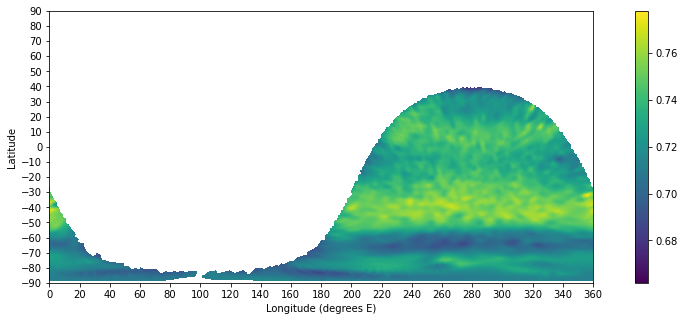

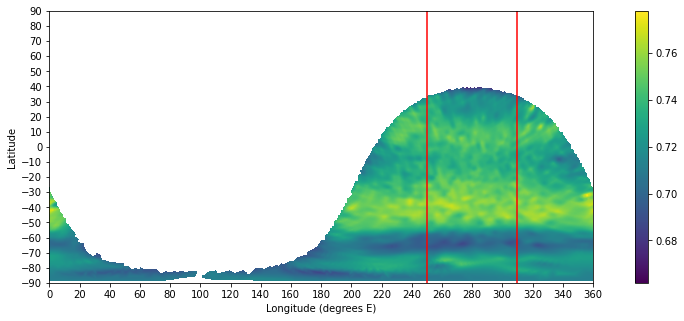

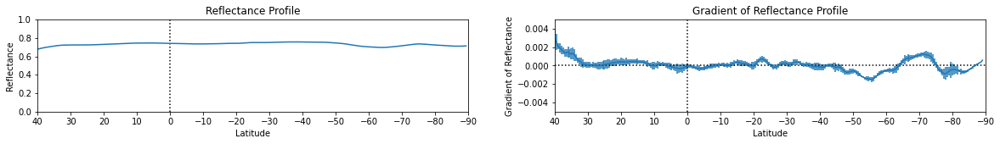

Data Successfully Written to: plotdata/2007_467.csv


In [59]:
good = False
file = get_pkg_data_filename('maps/2007/467_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 250#float(input('Please input the leftmost longitude of the range desired: '))
    right = 310#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2007_467.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

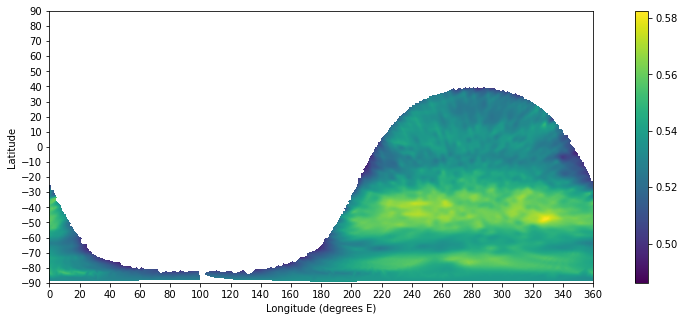

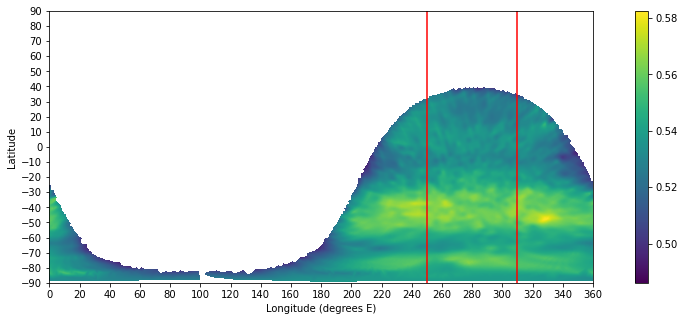

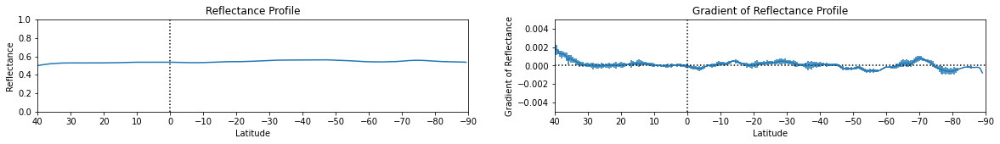

Data Successfully Written to: plotdata/2007_547.csv


In [60]:
good = False
file = get_pkg_data_filename('maps/2007/547_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 250#float(input('Please input the leftmost longitude of the range desired: '))
    right = 310#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2007_547.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

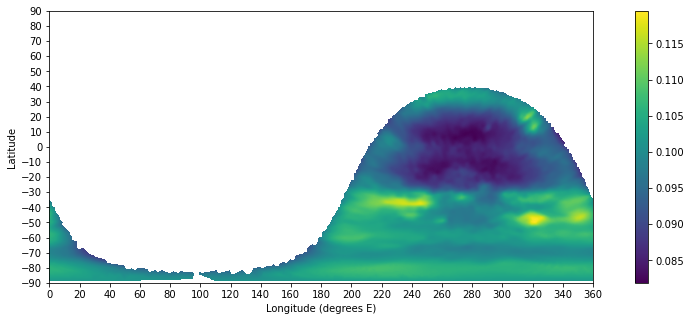

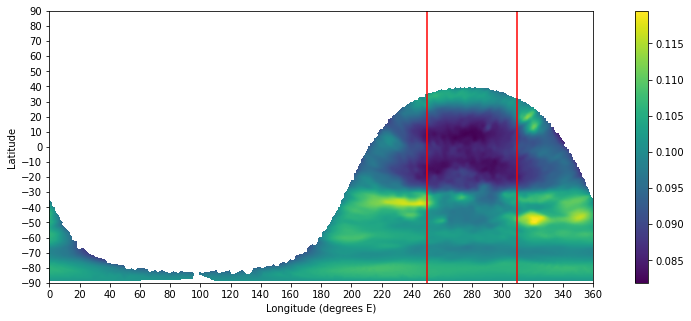

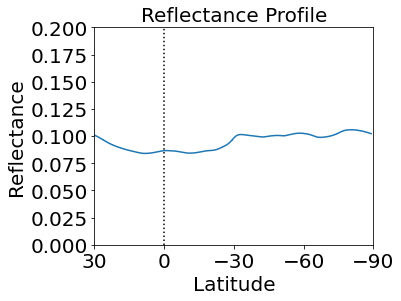

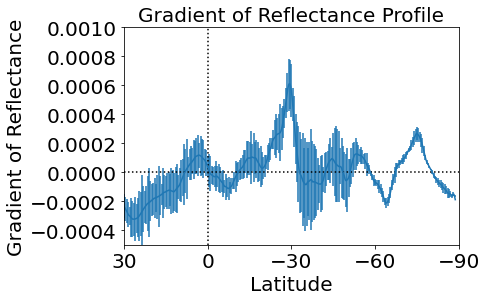

Data Successfully Written to: plotdata/2007_CH4.csv


In [61]:
good = False
file = get_pkg_data_filename('maps/2007/CH4_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 250#float(input('Please input the leftmost longitude of the range desired: '))
    right = 310#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(5,4)) #set up a figure space
axR = plt.subplot(111) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile', fontsize=20)
plt.xticks([30,0,-30,-60,-90], fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel('Latitude', fontsize=20)
plt.xlim([30,-90]) #latitude limit setting
plt.ylabel('Reflectance', fontsize=20)
plt.ylim([0,0.2]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

#plt.figure(figsize=(5,4))
axR = plt.subplot(111) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile', fontsize=20)
plt.xticks([30,0,-30,-60,-90], fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel('Latitude', fontsize=20)
plt.xlim([30,-90]) #latitude limit setting
plt.ylabel('Gradient of Reflectance', fontsize=20)
plt.ylim([-0.0005,0.001]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2007_CH4.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

# Year 2006

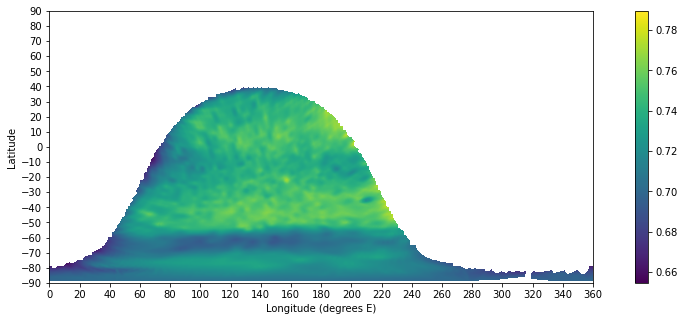

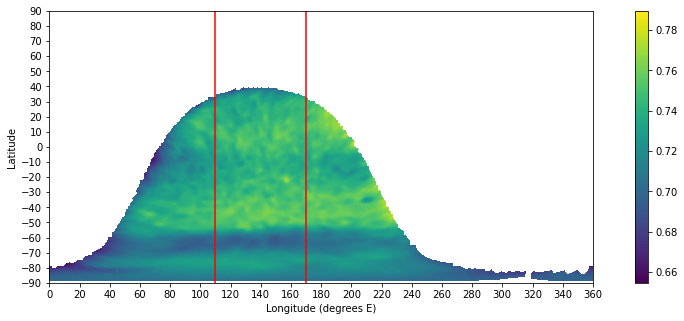

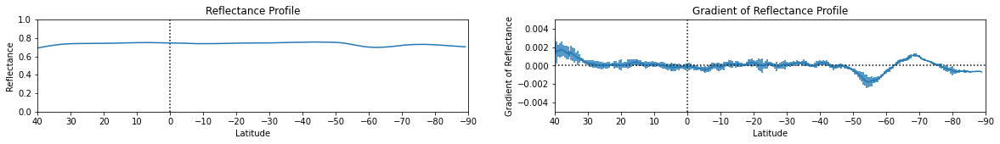

Data Successfully Written to: plotdata/2006_467.csv


In [62]:
good = False
file = get_pkg_data_filename('maps/2006/467_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 110#float(input('Please input the leftmost longitude of the range desired: '))
    right = 170#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2006_467.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

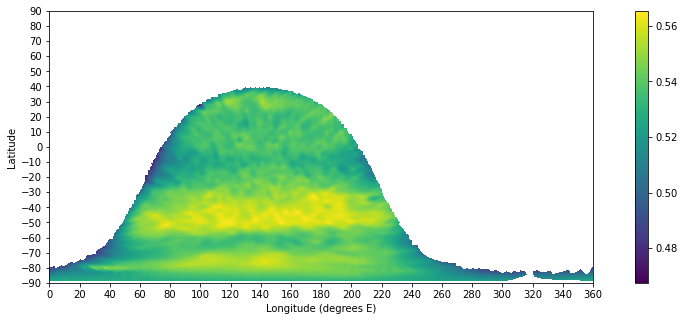

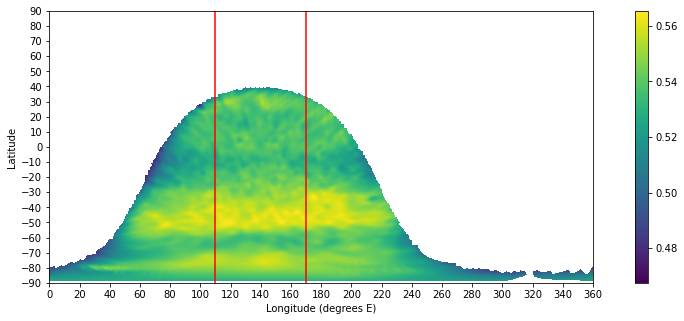

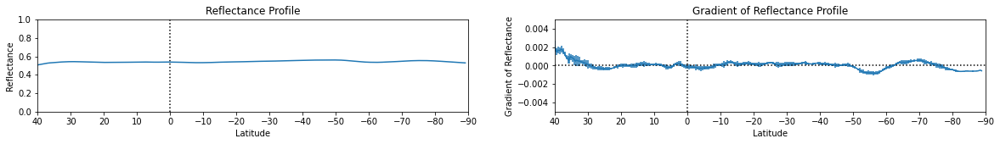

Data Successfully Written to: plotdata/2006_547.csv


In [63]:
good = False
file = get_pkg_data_filename('maps/2006/547_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 110#float(input('Please input the leftmost longitude of the range desired: '))
    right = 170#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2006_547.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

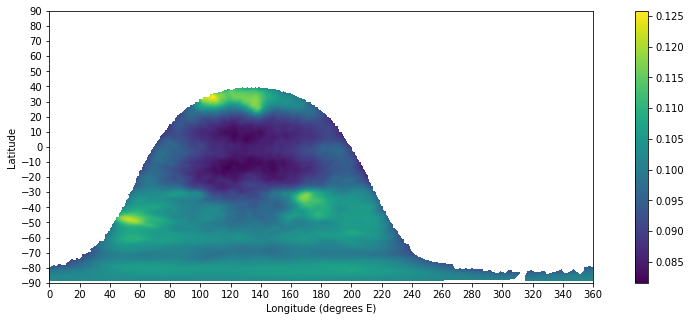

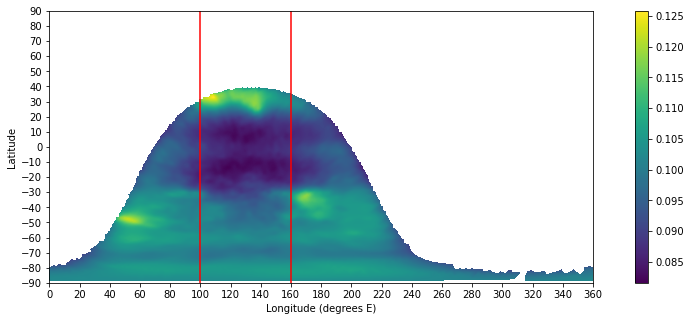

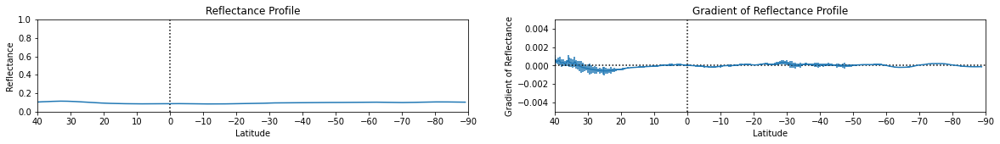

Data Successfully Written to: plotdata/2006_CH4.csv


In [64]:
good = False
file = get_pkg_data_filename('maps/2006/CH4_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 100#float(input('Please input the leftmost longitude of the range desired: '))
    right = 160#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2006_CH4.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

# Year 2005

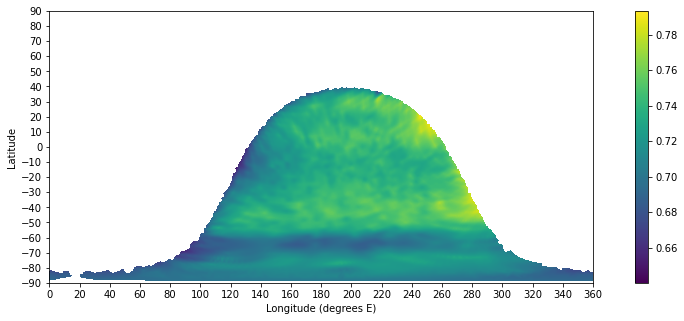

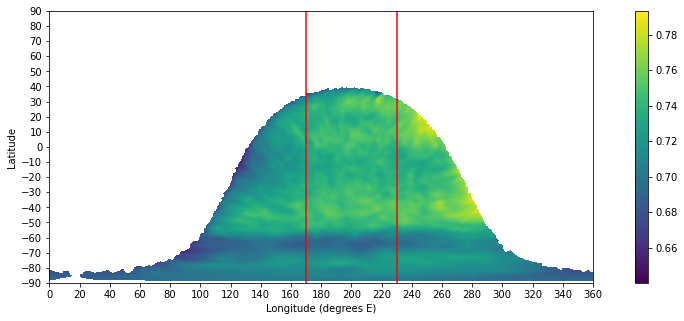

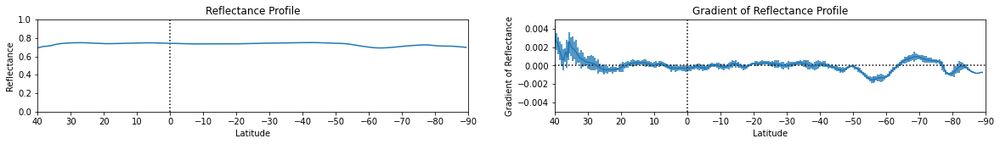

Data Successfully Written to: plotdata/2005_467.csv


In [65]:
good = False
file = get_pkg_data_filename('maps/2005/467_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 170#float(input('Please input the leftmost longitude of the range desired: '))
    right = 230#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2005_467.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

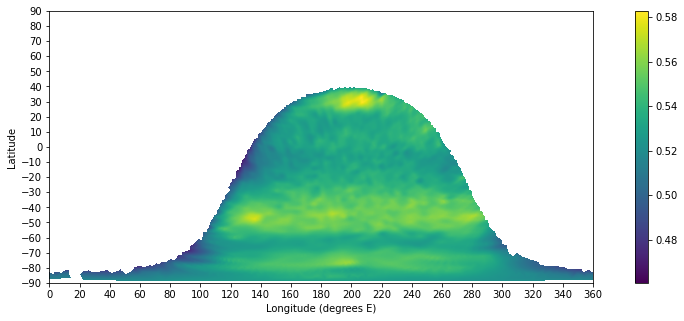

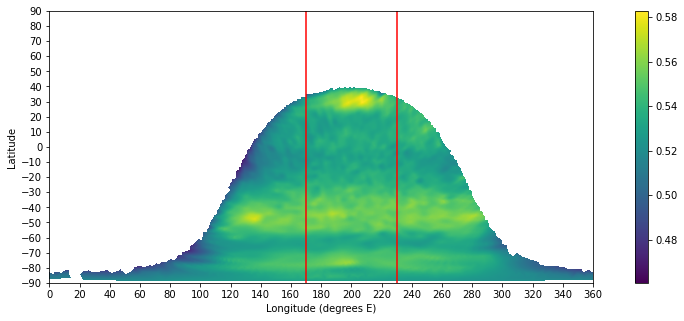

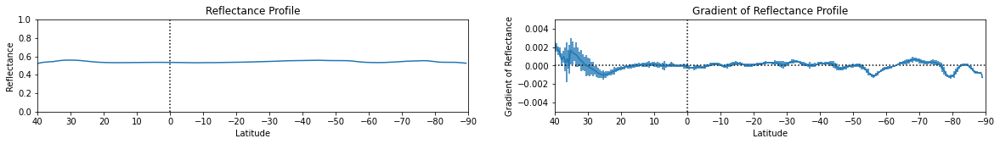

Data Successfully Written to: plotdata/2005_547.csv


In [66]:
good = False
file = get_pkg_data_filename('maps/2005/547_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 170#float(input('Please input the leftmost longitude of the range desired: '))
    right = 230#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2005_547.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

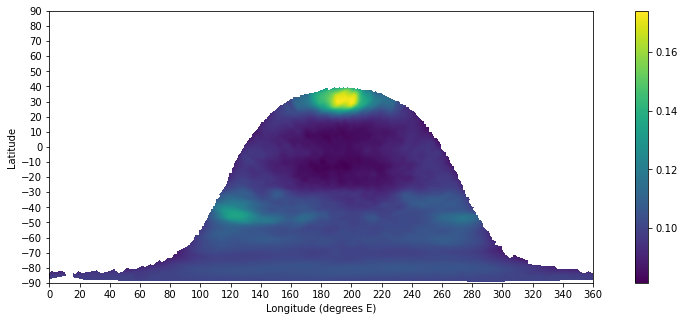

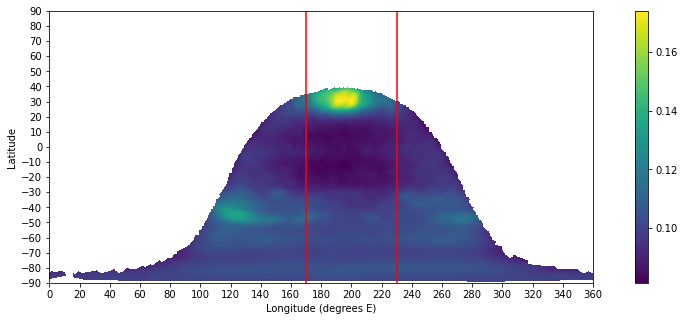

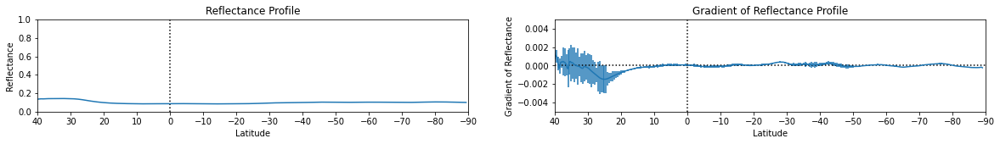

Data Successfully Written to: plotdata/2005_CH4.csv


In [67]:
good = False
file = get_pkg_data_filename('maps/2005/CH4_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 170#float(input('Please input the leftmost longitude of the range desired: '))
    right = 230#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2005_CH4.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

# Year 2004

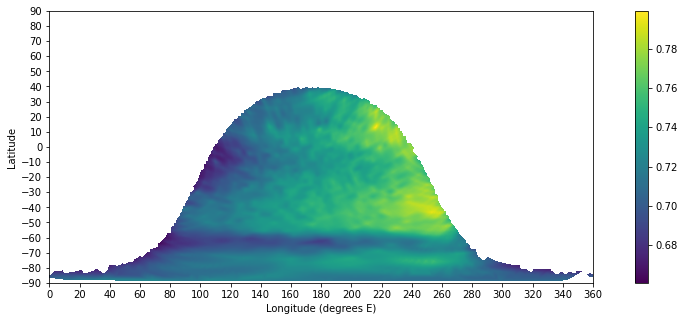

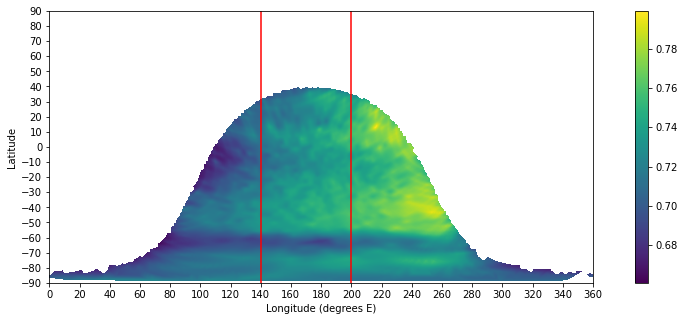

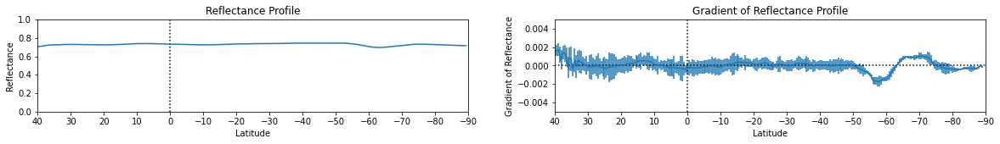

Data Successfully Written to: plotdata/2004_467.csv


In [68]:
good = False
file = get_pkg_data_filename('maps/2004/467_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 140#float(input('Please input the leftmost longitude of the range desired: '))
    right = 200#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2004_467.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

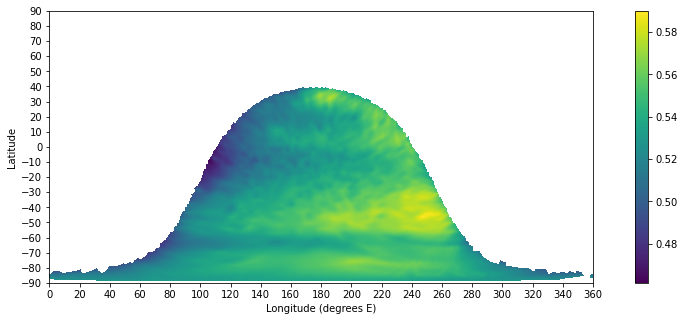

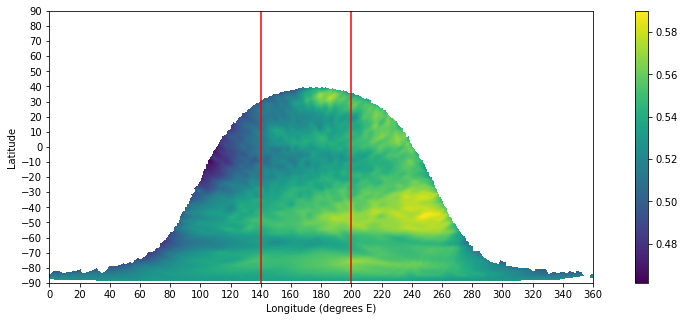

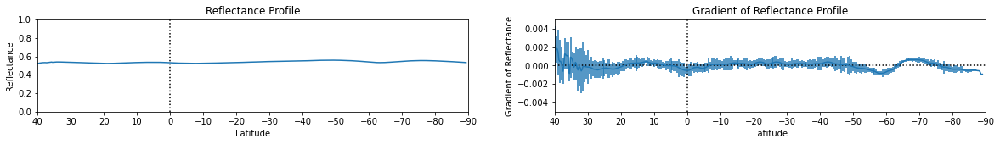

Data Successfully Written to: plotdata/2004_547.csv


In [69]:
good = False
file = get_pkg_data_filename('maps/2004/547_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 140#float(input('Please input the leftmost longitude of the range desired: '))
    right = 200#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2004_547.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

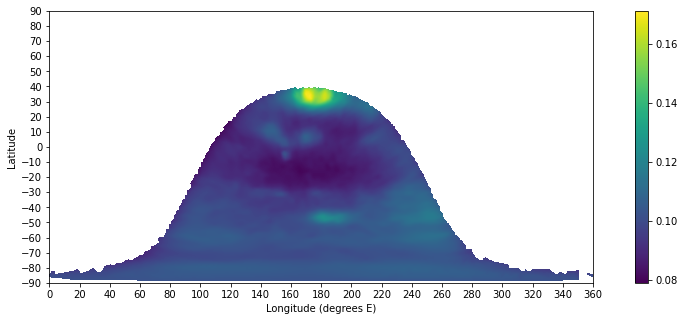

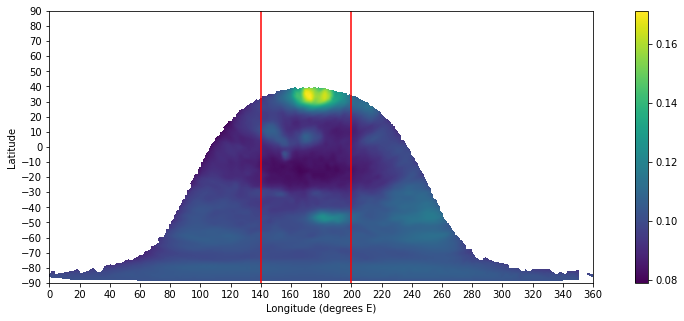

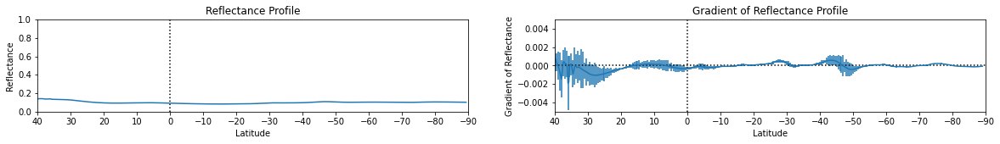

Data Successfully Written to: plotdata/2004_CH4.csv


In [70]:
good = False
file = get_pkg_data_filename('maps/2004/CH4_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 140#float(input('Please input the leftmost longitude of the range desired: '))
    right = 200#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2004_CH4.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

# Year 2001

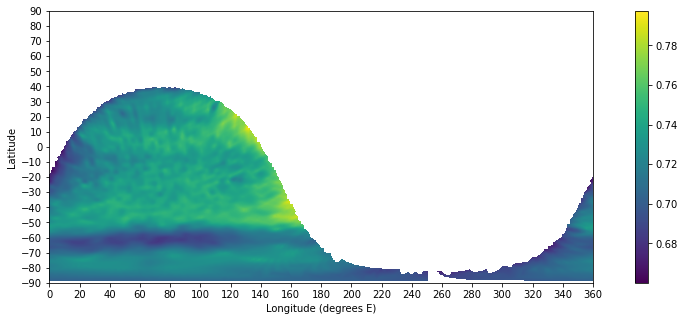

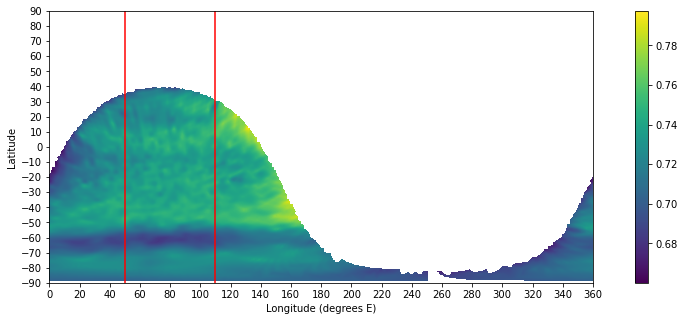

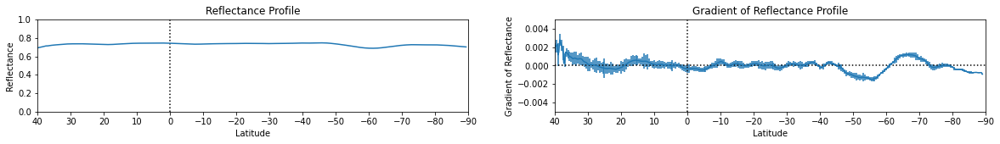

Data Successfully Written to: plotdata/2001_467.csv


In [71]:
good = False
file = get_pkg_data_filename('maps/2001/467_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 50#float(input('Please input the leftmost longitude of the range desired: '))
    right = 110#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2001_467.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

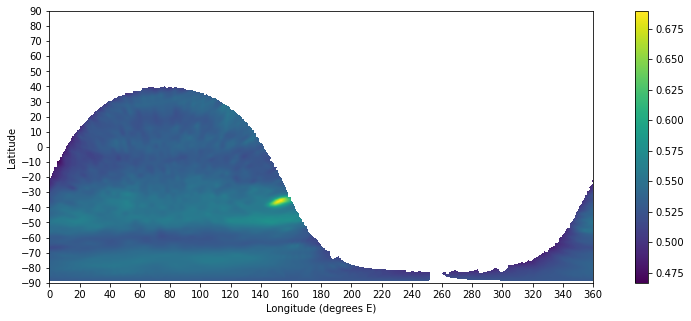

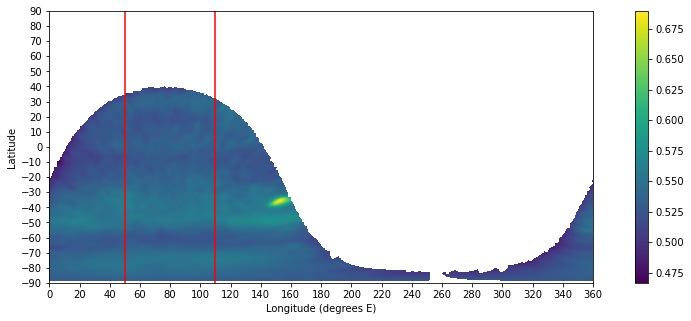

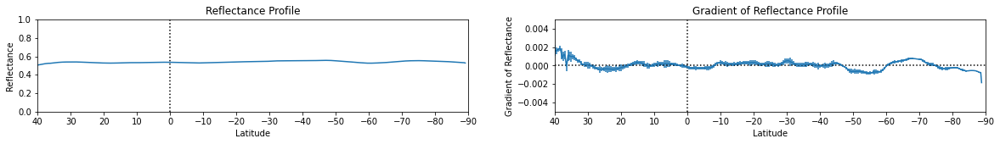

Data Successfully Written to: plotdata/2001_547.csv


In [72]:
good = False
file = get_pkg_data_filename('maps/2001/547_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 50#float(input('Please input the leftmost longitude of the range desired: '))
    right = 110#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2001_547.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

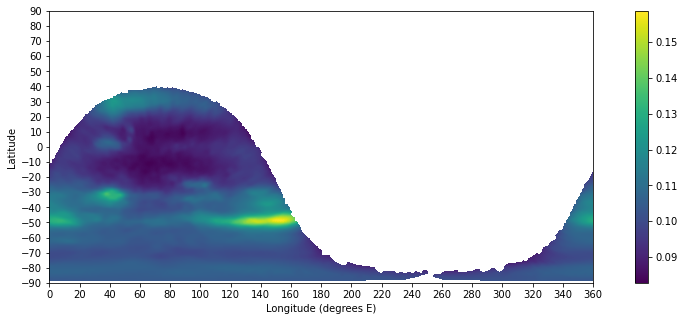

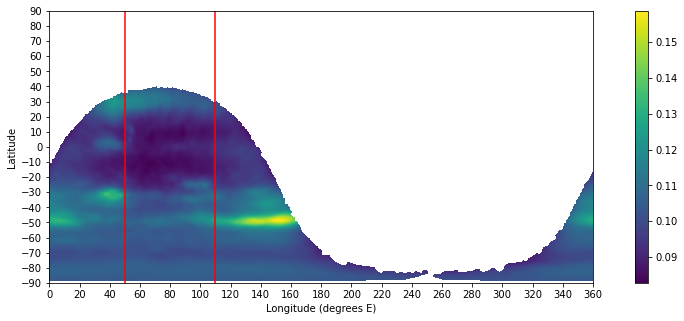

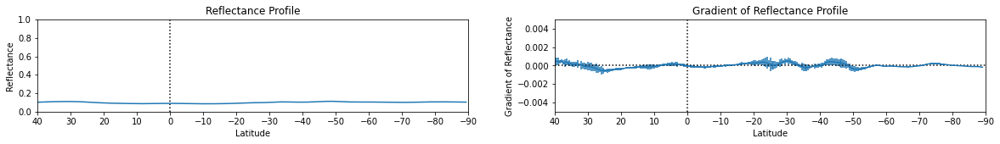

Data Successfully Written to: plotdata/2001_CH4.csv


In [73]:
good = False
file = get_pkg_data_filename('maps/2001/CH4_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 50#float(input('Please input the leftmost longitude of the range desired: '))
    right = 110#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2001_CH4.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

# Year 2000

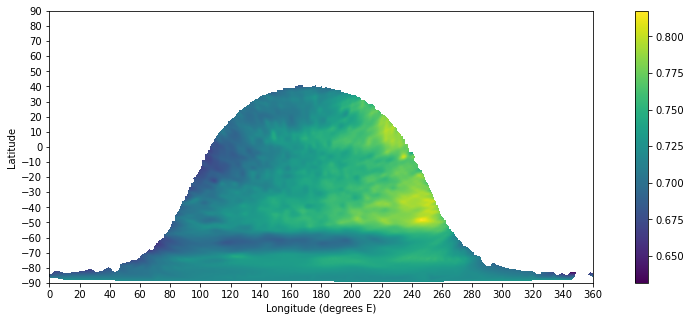

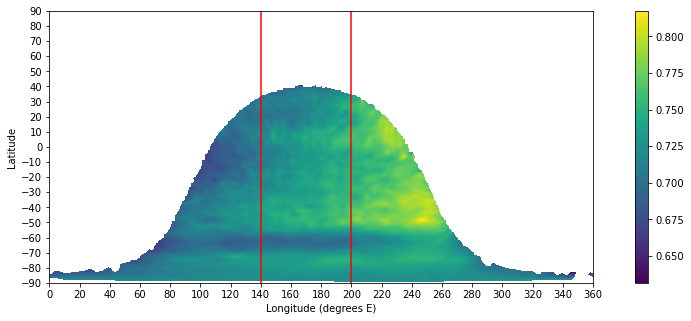

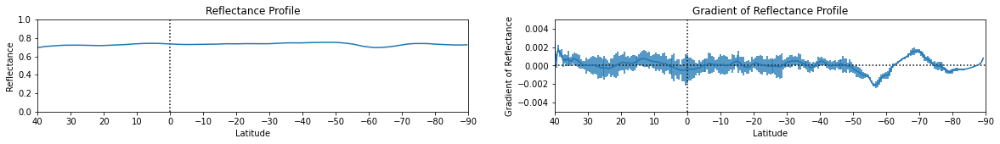

Data Successfully Written to: plotdata/2000_467.csv


In [74]:
good = False
file = get_pkg_data_filename('maps/2000/467_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 140#float(input('Please input the leftmost longitude of the range desired: '))
    right = 200#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2000_467.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

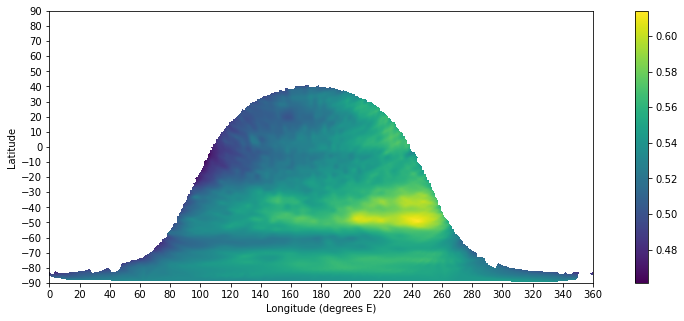

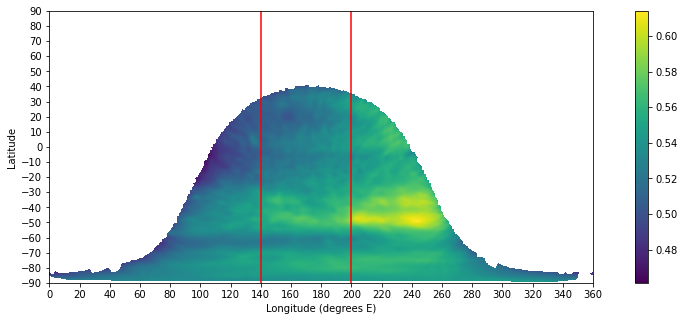

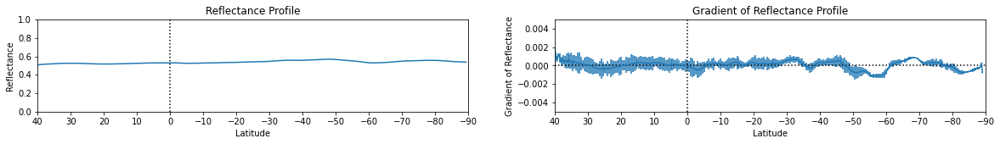

Data Successfully Written to: plotdata/2000_547.csv


In [75]:
good = False
file = get_pkg_data_filename('maps/2000/547_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 140#float(input('Please input the leftmost longitude of the range desired: '))
    right = 200#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True

img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2000_547.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)

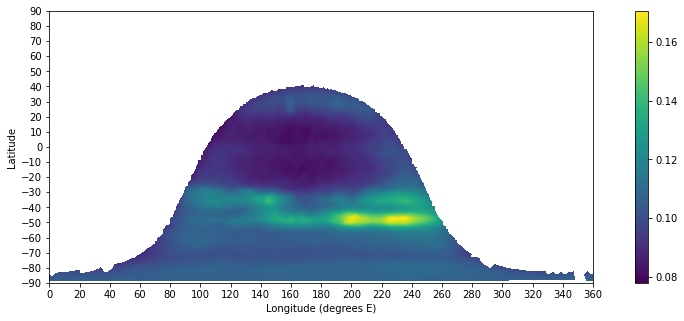

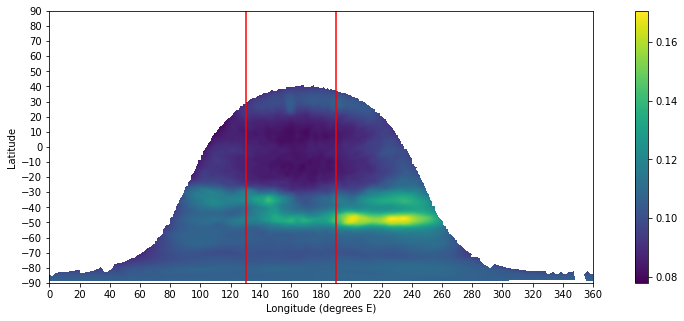

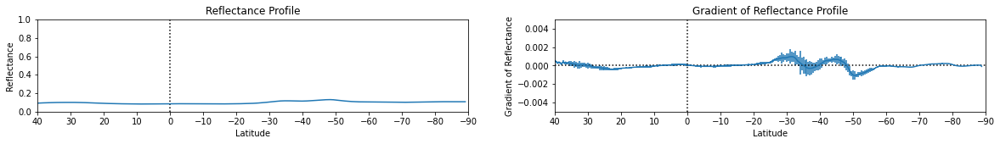

Data Successfully Written to: plotdata/2000_CH4.csv


In [76]:
good = False
file = get_pkg_data_filename('maps/2000/CH4_1.fits')
data = ast.getdata(file,ext=0)
resolution = data.shape

lat = -1*(((180/resolution[0])*np.arange(resolution[0]))-90)
latticks = [-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90]

long = (360/resolution[1])*np.arange(resolution[1])
longticks = [0,20,40,60,80,100,120,140,160,180,200,220,240,260,280,300,320,340,360]

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(111)
im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
plt.xlabel("Longitude (degrees E)")
plt.ylabel("Latitude")
plt.xticks(longticks)
plt.yticks(latticks)
plt.colorbar(im1)
plt.show()

while good == False:
    left = 130#float(input('Please input the leftmost longitude of the range desired: '))
    right = 190#float(input('Please input the rightmost longitude of the range desired: '))
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(111)
    im1 = ax1.imshow(data, cmap='viridis', extent=[0,360,-90,90])
    plt.xlabel("Longitude (degrees E)")
    plt.ylabel("Latitude")
    plt.xticks(longticks)
    plt.yticks(latticks)
    plt.colorbar(im1)
    ax1.axvline(left,color='red')
    ax1.axvline(right,color='red')
    plt.show()
    
    happy = 'y'#str(input('Is this longitude range appropriate? (y/n): '))
    if happy == 'y':
        good = True
img = restrict_long(data,long_to_res(resolution[1],long,right),long_to_res(resolution[1],long,left))

# This code block is a debug tool, shows the extracted longitude region of the image
# fig = plt.figure(figsize=(15,5))
# ax1 = fig.add_subplot(111)
# im1 = ax1.imshow(img, cmap='viridis')
# plt.colorbar(im1)
# plt.show()
    
R = np.zeros(img.shape[0])
Rsem = np.zeros(img.shape[0])
for j in range(img.shape[0]): 
    R[j] = np.mean(img[j][np.where(np.isnan(img[j])==False)])
    Rsem[j] = sem(img[j][np.where(np.isnan(img[j])==False)])
R = R
GradR = np.gradient(R)
Rsem = Rsem
GradRErr = graderr(R,Rsem,10)

plt.figure(figsize=(20,2)) #set up a figure space
axR = plt.subplot(121) #create a set of axes within the figure
axR.errorbar(lat, R, yerr = Rsem, errorevery = degpererrbar*2)
plt.title('Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Reflectance')
plt.ylim([0,1]) #reflectance limit setting
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator

axR = plt.subplot(122) #create a set of axes within the figure
axR.errorbar(lat, GradR, yerr=GradRErr, errorevery = degpererrbar*2)
plt.title('Gradient of Reflectance Profile')
plt.xticks(latticks)
plt.xlabel('Latitude')
plt.xlim(latlimits) #latitude limit setting
plt.ylabel('Gradient of Reflectance')
plt.ylim([-0.005,0.005]) #reflectance limit setting
plt.axhline(y=0, color='black', ls=':')
plt.axvline(x=0, color='black', ls=':') #plots line at neptunian equator
plt.show()

rows = []

for i in range(len(R)):
    rows.append([R[i],GradR[i],Rsem[i],GradRErr[i],lat[i]])

csv_loc = 'plotdata/2000_CH4.csv'
with open(csv_loc, mode='w') as file:       
    writer = csv.writer(file, delimiter=',')

    for i in range(len(rows)):
        writer.writerow(rows[i])
print('Data Successfully Written to:',csv_loc)